In [20]:
import opendatasets
opendatasets.download('https://www.kaggle.com/datasets/andrewmvd/lung-and-colon-cancer-histopathological-images/code')

Skipping, found downloaded files in "./lung-and-colon-cancer-histopathological-images" (use force=True to force download)


In [21]:
import os

folder_paths = [
    "/Users/jazlyn/dip project/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca",
    "/Users/jazlyn/dip project/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_n"
]

# Function to count the number of images in a folder
def count_images_in_folder(folder_path):
    image_count = len([f for f in os.listdir(folder_path) if f.endswith(".jpeg")])
    return image_count

# Iterate through the folder paths and print the number of images
for folder_path in folder_paths:
    image_count = count_images_in_folder(folder_path)
    print(f"Number of images in {folder_path}: {image_count}")

Number of images in /Users/jazlyn/dip project/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca: 5000
Number of images in /Users/jazlyn/dip project/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_n: 5000


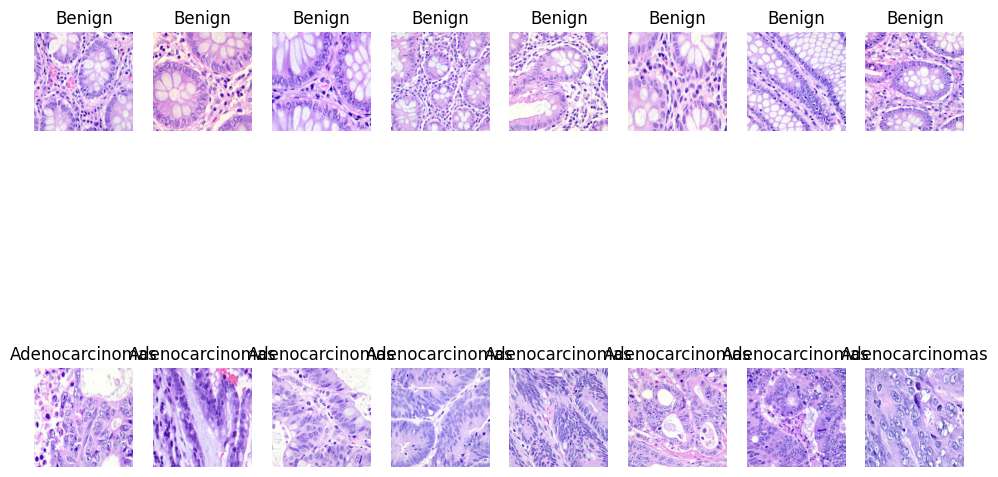

In [22]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Specify the directories for both classes
adenocarcinomas_class_dir = '/Users/jazlyn/dip project/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca'  # Positive changed to Benign
benign_class_dir = '/Users/jazlyn/dip project/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_n'  # Negative changed to Adenocarcinomas

# List the image files in both classes
benign_images = os.listdir(benign_class_dir)
adenocarcinomas_images = os.listdir(adenocarcinomas_class_dir)

# Define the number of images to display from each class
num_images_to_display = 8  #

# Randomly select images from both classes
selected_benign_images = random.sample(benign_images, num_images_to_display)
selected_adenocarcinomas_images = random.sample(adenocarcinomas_images, num_images_to_display)

# Display the selected images from the "Benign" class
plt.figure(figsize=(12, 8))
for i, image_file in enumerate(selected_benign_images):
    image_path = os.path.join(benign_class_dir, image_file)
    img = mpimg.imread(image_path)
    plt.subplot(2, num_images_to_display, i + 1)
    plt.imshow(img)
    plt.title('Benign')
    plt.axis('off')

# Display the selected images from the "Adenocarcinomas" class
for i, image_file in enumerate(selected_adenocarcinomas_images):
    image_path = os.path.join(adenocarcinomas_class_dir, image_file)
    img = mpimg.imread(image_path)
    plt.subplot(2, num_images_to_display, num_images_to_display + i + 1)
    plt.imshow(img)
    plt.title('Adenocarcinomas')
    plt.axis('off')

plt.show()

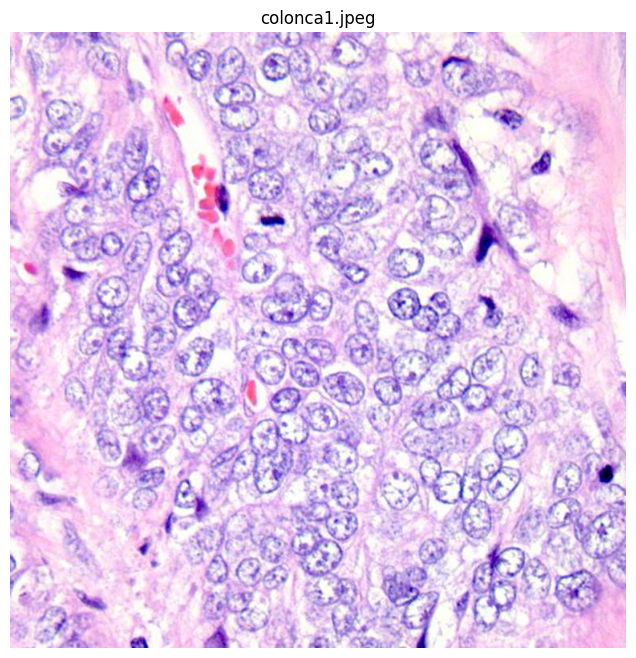

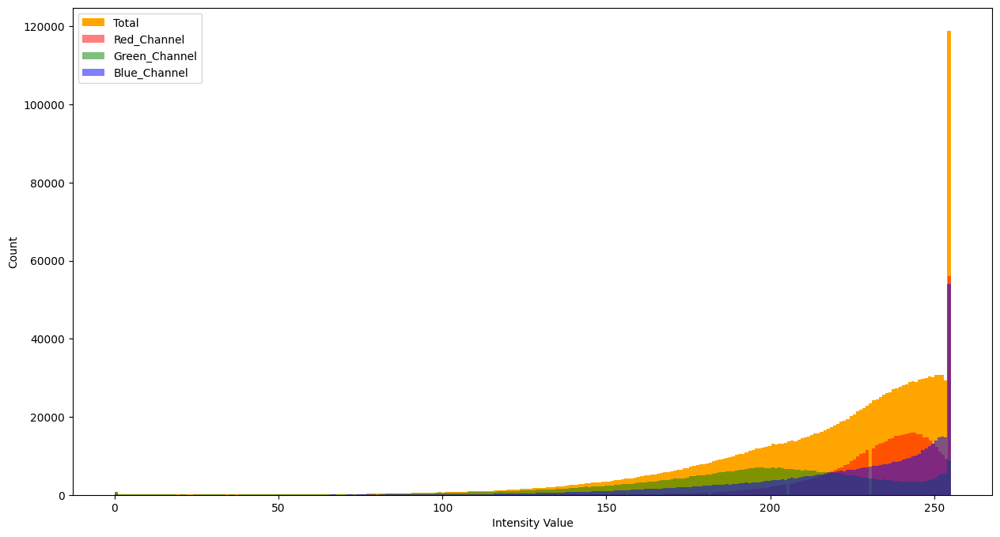

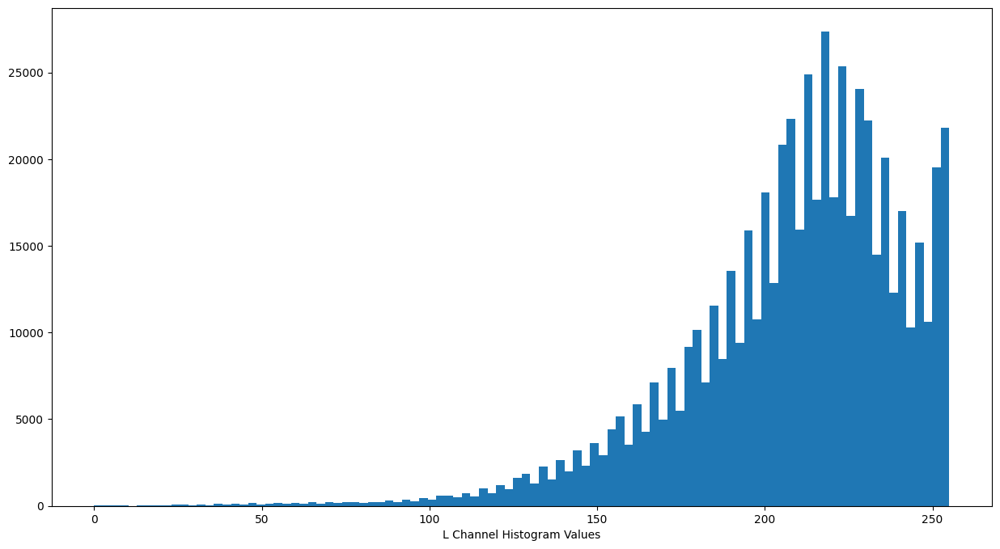

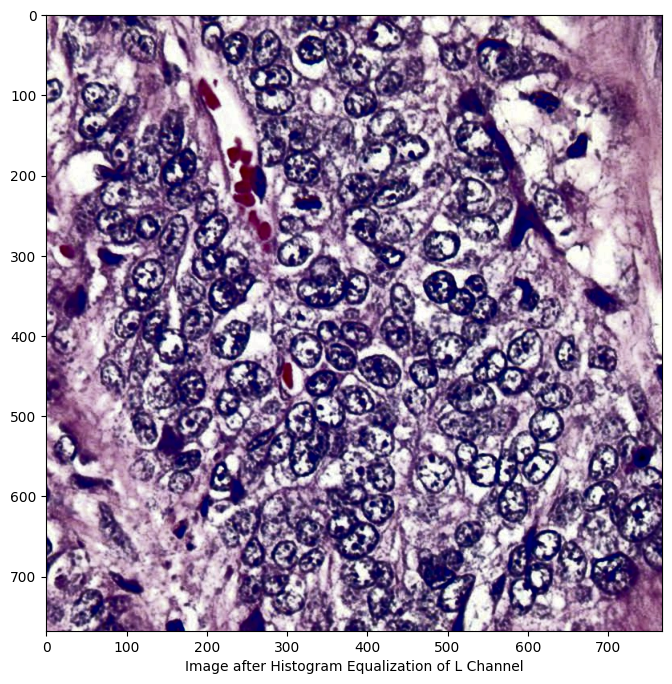

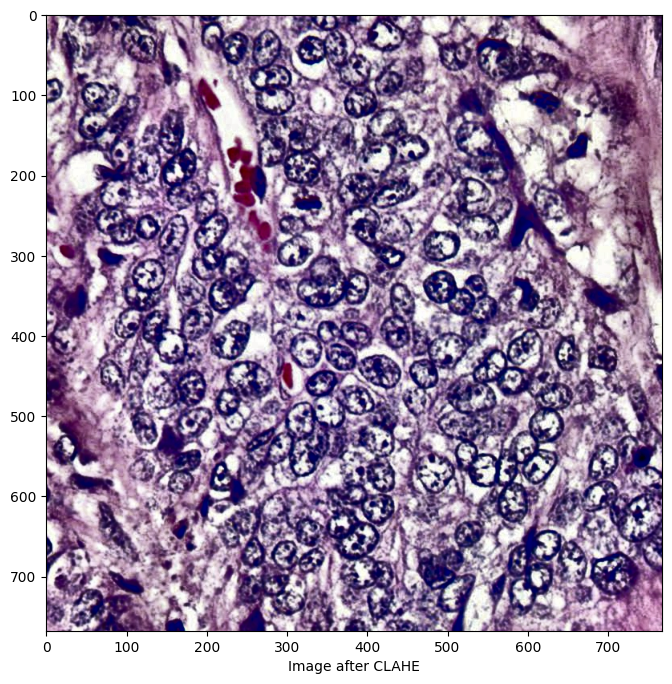

...

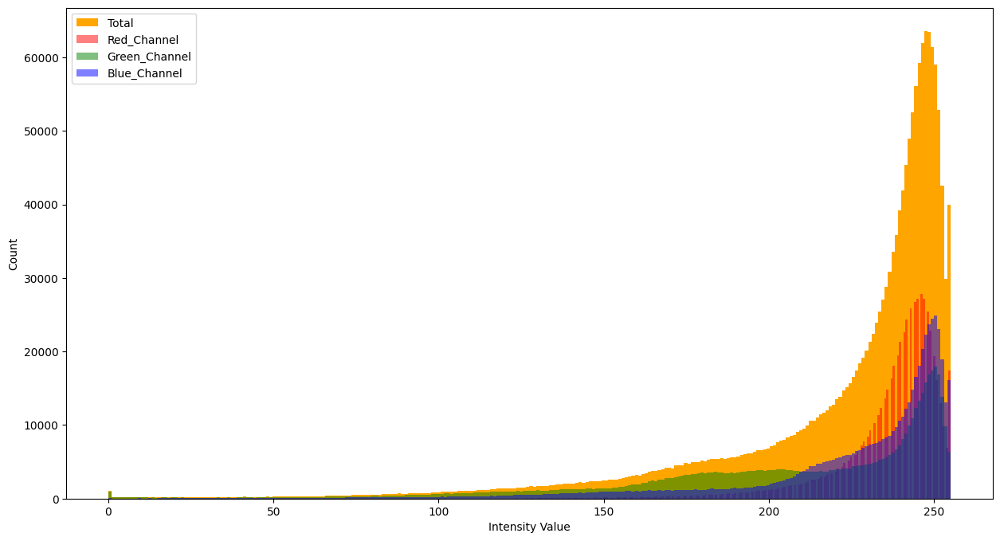

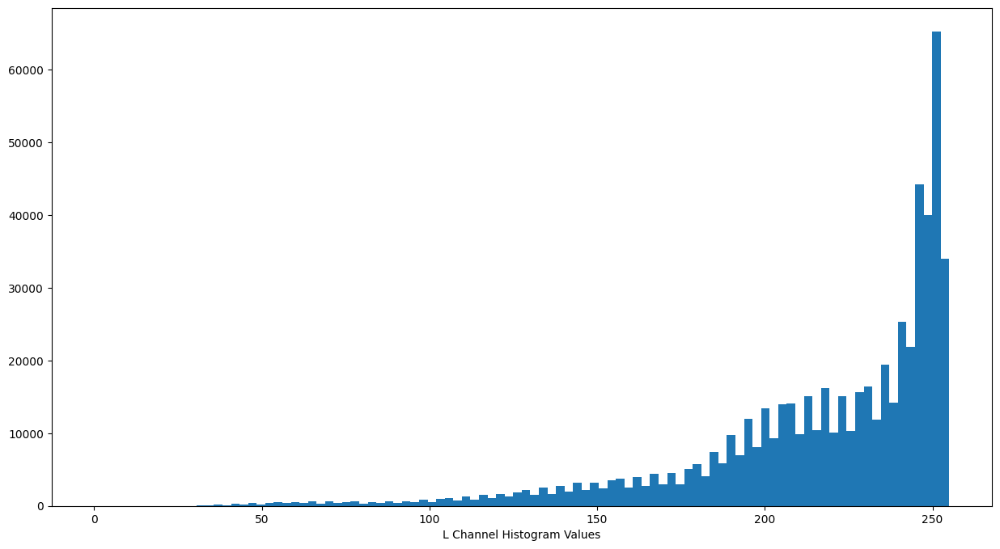

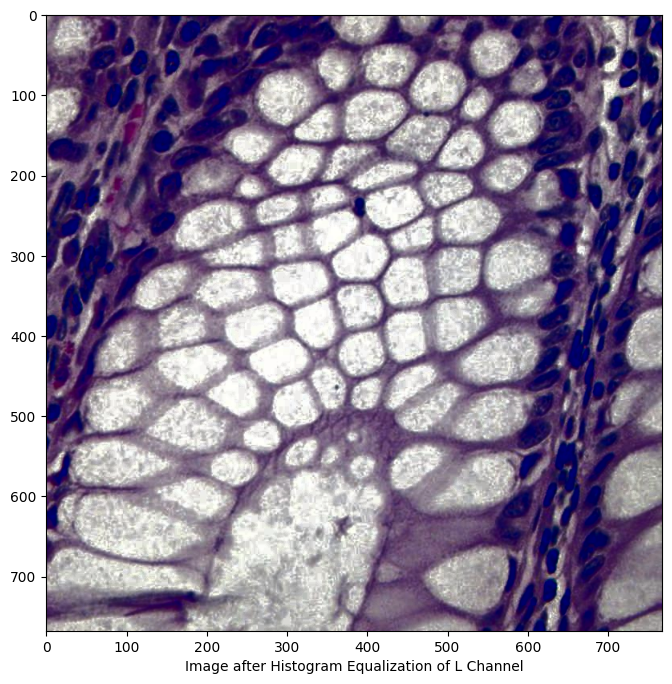

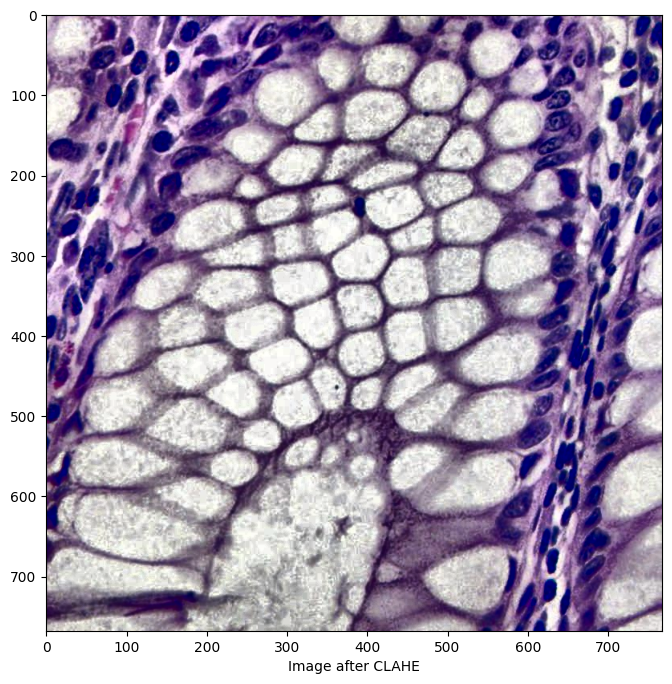

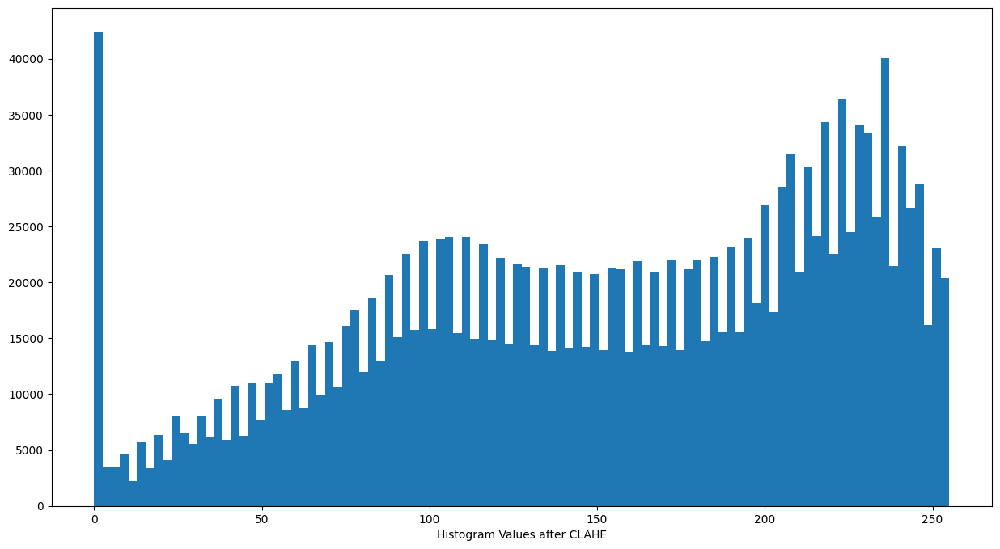

In [29]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# List of image paths
image_paths = ['/Users/jazlyn/dip project/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca/colonca1.jpeg', 'lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_n/colonn1.jpeg']

for i in image_paths:
    # Load the image
    image = cv2.imread(i)

    # Display the original image
    plt.figure(figsize=(15, 8))
    plt.title(i.split('/')[-1])
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

    # Plot the histogram of the image
    plt.figure(figsize=(15, 8))
    plt.hist(image.ravel(), bins=256, color='orange')
    plt.hist(image[:, :, 0].ravel(), bins=256, color='red', alpha=0.5)
    plt.hist(image[:, :, 1].ravel(), bins=256, color='green', alpha=0.5)
    plt.hist(image[:, :, 2].ravel(), bins=256, color='blue', alpha=0.5)
    plt.xlabel('Intensity Value')
    plt.ylabel('Count')
    plt.legend(['Total', 'Red_Channel', 'Green_Channel', 'Blue_Channel'])
    plt.show()

    # Plot the histogram of the L channel in LAB color space
    plt.figure(figsize=(15, 8))
    lab_img = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab_img)
    plt.hist(l.flat, bins=100, range=(0, 255))
    plt.xlabel('L Channel Histogram Values')
    plt.show()

    # Apply histogram equalization to the L channel
    equ = cv2.equalizeHist(l)

    # Display the image after histogram equalization
    plt.figure(figsize=(15, 8))
    updated_lab_img = cv2.merge((equ, a, b))
    hist_eq_img = cv2.cvtColor(updated_lab_img, cv2.COLOR_LAB2BGR)
    plt.imshow(cv2.cvtColor(hist_eq_img, cv2.COLOR_BGR2RGB))
    plt.xlabel('Image after Histogram Equalization of L Channel')
    plt.show()

    # Apply CLAHE to the L channel
    clahe = cv2.createCLAHE(clipLimit=4.0, tileGridSize=(8, 8))
    clahe_img = clahe.apply(equ)

    # Display the image after CLAHE
    plt.figure(figsize=(15, 8))
    updated_lab_img2 = cv2.merge((clahe_img, a, b))
    CLAHE_img = cv2.cvtColor(updated_lab_img2, cv2.COLOR_LAB2BGR)
    plt.imshow(cv2.cvtColor(CLAHE_img, cv2.COLOR_BGR2RGB))
    plt.xlabel('Image after CLAHE')
    plt.show()

    # Plot the histogram of the image after CLAHE
    plt.figure(figsize=(15, 8))
    plt.hist(CLAHE_img.flat, bins=100, range=(0, 255))
    plt.xlabel('Histogram Values after CLAHE')
    plt.show()

# applying clahe on all images

In [40]:
import cv2
import os

# Define the paths to the dataset
colon_aca_path = '/Users/jazlyn/dip project/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca'
colon_n_path = '/Users/jazlyn/dip project/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_n'

# Function to apply CLAHE to an image
def apply_clahe(image):
    lab_img = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab_img)

    # Apply CLAHE to the L channel
    clahe = cv2.createCLAHE(clipLimit=4.0, tileGridSize=(8, 8))
    clahe_img = clahe.apply(l)

    # Merge the channels back to LAB
    updated_lab_img = cv2.merge((clahe_img, a, b))

    # Convert the image back to BGR
    result_img = cv2.cvtColor(updated_lab_img, cv2.COLOR_LAB2BGR)

    return result_img

# Function to apply CLAHE to all images in a directory
def apply_clahe_to_directory(directory_path):
    for filename in os.listdir(directory_path):
        image_path = os.path.join(directory_path, filename)

        # Load the image
        image = cv2.imread(image_path)

        # Apply CLAHE
        transformed_image = apply_clahe(image)

        # Save the transformed image (overwrite the original)
        cv2.imwrite(image_path, transformed_image)

# Apply CLAHE to all images in the 'colon_aca' directory
apply_clahe_to_directory(colon_aca_path)

# Apply CLAHE to all images in the 'colon_n' directory
apply_clahe_to_directory(colon_n_path)


In [47]:
from skimage.metrics import structural_similarity as ssim
import cv2
import numpy as np

# List of image paths
image_paths = ['/Users/jazlyn/dip project/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca/colonca1.jpeg', '/Users/jazlyn/dip project/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_n/colonn1.jpeg']

for i in image_paths:
    # Load the image
    image = cv2.imread(i)

    # Convert to LAB color space
    lab_img = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab_img)

    # Apply histogram equalization to the L channel
    equ = cv2.equalizeHist(l)

    # Merge the channels back to LAB
    updated_lab_img = cv2.merge((equ, a, b))

    # Convert the image after histogram equalization to RGB
    hist_eq_img = cv2.cvtColor(updated_lab_img, cv2.COLOR_LAB2BGR)

    # Apply CLAHE to the L channel
    clahe = cv2.createCLAHE(clipLimit=4.0, tileGridSize=(8, 8))
    clahe_img = clahe.apply(equ)

    # Merge the channels back to LAB
    updated_lab_img2 = cv2.merge((clahe_img, a, b))

    # Convert the image after CLAHE to RGB
    CLAHE_img = cv2.cvtColor(updated_lab_img2, cv2.COLOR_LAB2BGR)

    # Calculate SSIM
    ssim_he = ssim(cv2.cvtColor(hist_eq_img, cv2.COLOR_BGR2GRAY), cv2.cvtColor(image, cv2.COLOR_BGR2GRAY))
    ssim_clahe = ssim(cv2.cvtColor(CLAHE_img, cv2.COLOR_BGR2GRAY), cv2.cvtColor(image, cv2.COLOR_BGR2GRAY))

    # Print the SSIM values
    print(f"SSIM after Histogram Equalization: {ssim_he}")
    print(f"SSIM after CLAHE: {ssim_clahe}")


SSIM after Histogram Equalization: 0.9908500329017822
SSIM after CLAHE: 0.9811194565787521
SSIM after Histogram Equalization: 0.8555479912598589
SSIM after CLAHE: 0.856925387878299


# resizing

In [41]:
import cv2
import os

def resize_and_overwrite(directory):
    # Iterate through each file in the directory
    for filename in os.listdir(directory):
        if filename.endswith(('.jpeg', '.jpg')):
            # Construct the full file path
            file_path = os.path.join(directory, filename)

            # Read the image
            img = cv2.imread(file_path)

            # Check if the image is successfully loaded
            if img is not None:
                # Resize the image to 256x256
                img_resized = cv2.resize(img, (256, 256), interpolation=cv2.INTER_AREA)

                # Save the resized image, overwriting the original
                cv2.imwrite(file_path, img_resized)

        # Check if any image was resized
    print(f"Resized all images in place.")

# List of folders to resize images
folders_to_resize = [
    '/Users/jazlyn/dip project/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca',
    '/Users/jazlyn/dip project/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_n',
]

# Resize and overwrite images in each specified folder
for folder in folders_to_resize:
    resize_and_overwrite(folder)


Resized all images in place.
Resized all images in place.


In [ ]:
import cv2

# Image path
image_path = '/content/lung_colon_image_set/colon_image_sets/colon_aca/colonca1011.jpeg'

# Read the image
img = cv2.imread(image_path)

# Check if the image is successfully loaded
if img is None:
    print(f"Error: Could not read the image at path {image_path}")
else:
    # Get image dimensions
    height, width, channels = img.shape
    print(f"Image dimensions: Height={height}, Width={width}, Channels={channels}")


# thresholding

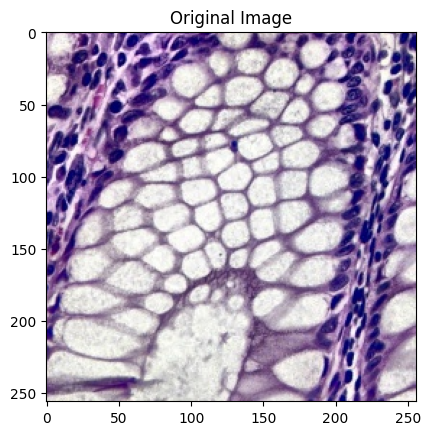

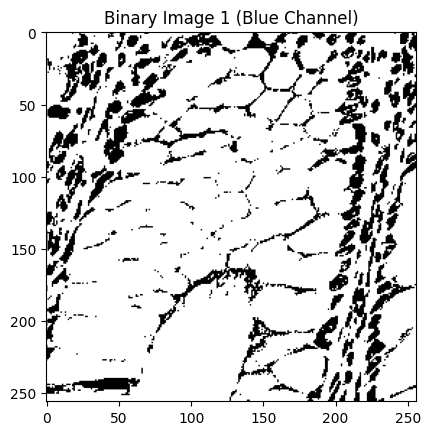

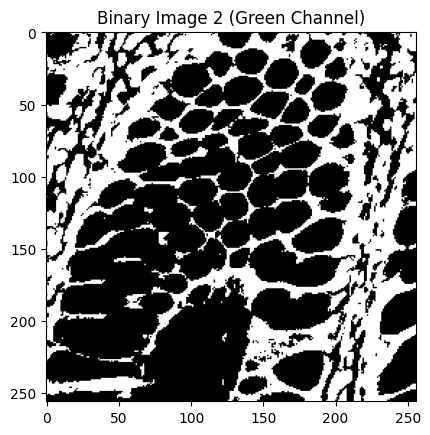

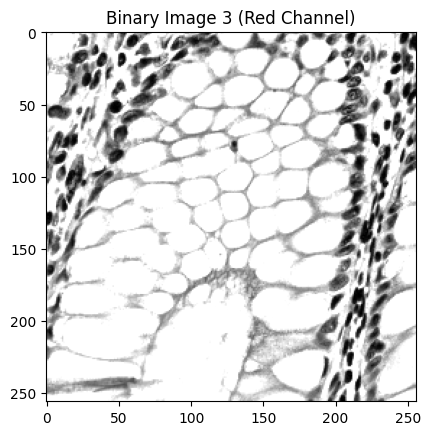

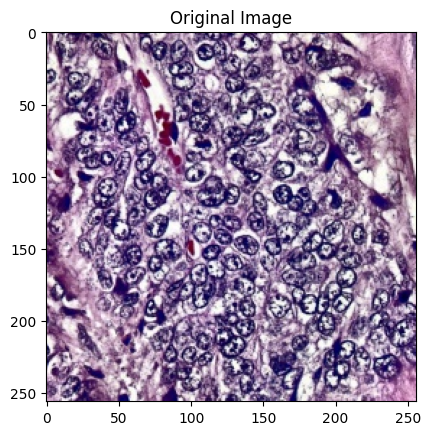

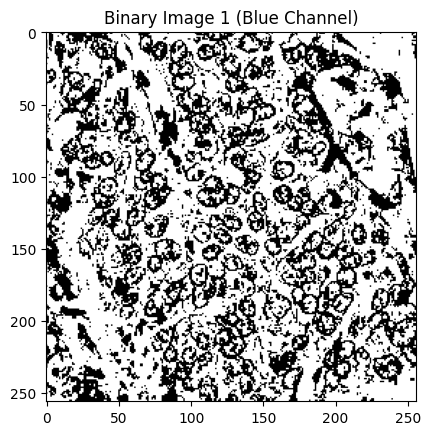

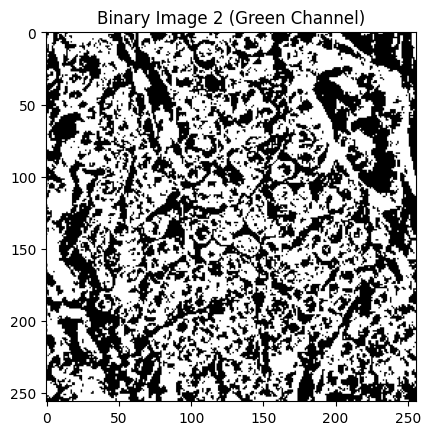

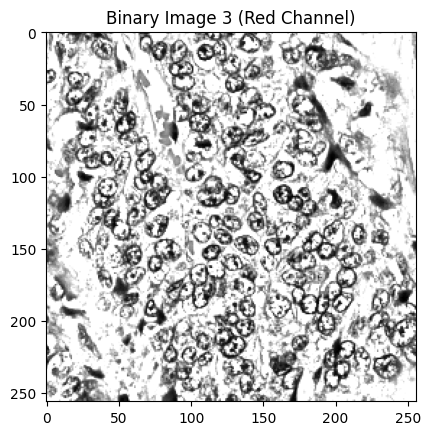

Thresholding complete.


In [43]:
import cv2
import os
import matplotlib.pyplot as plt

# List of image paths
image_paths = [
    '/Users/jazlyn/dip project/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_n/colonn1.jpeg',
    '/Users/jazlyn/dip project/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca/colonca1.jpeg'
]

for image_path in image_paths:
    # Read the original image
    img = cv2.imread(image_path)

    # Display the original image
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.show()

    # Apply different thresholding techniques to each color channel
    _, binary_img1 = cv2.threshold(img[:, :, 0], 127, 255, cv2.THRESH_BINARY)
    _, binary_img2 = cv2.threshold(img[:, :, 1], 127, 255, cv2.THRESH_BINARY_INV)
    _, binary_img3 = cv2.threshold(img[:, :, 2], 170, 255, cv2.THRESH_TRUNC)

    # Display the binary images for each color channel
    plt.imshow(binary_img1, cmap='gray')
    plt.title('Binary Image 1 (Blue Channel)')
    plt.show()

    plt.imshow(binary_img2, cmap='gray')
    plt.title('Binary Image 2 (Green Channel)')
    plt.show()

    plt.imshow(binary_img3, cmap='gray')
    plt.title('Binary Image 3 (Red Channel)')
    plt.show()

print("Thresholding complete.")

# thresholding all the images

In [53]:
import cv2
import os

# Function to apply thresholding and organize images
def process_and_organize_images(input_folder, output_folder):
    # Create the main output folder
    os.makedirs(output_folder, exist_ok=True)

    # Get the list of image paths in the input folder
    image_paths = [os.path.join(input_folder, filename) for filename in os.listdir(input_folder) if filename.endswith(('.jpeg', '.jpg'))]

    for image_path in image_paths:
        # Read the original image
        img = cv2.imread(image_path)

        # Create subfolder paths
        category_folder = os.path.join(output_folder, os.path.basename(os.path.dirname(image_path)))
        binary1_folder = os.path.join(category_folder, 'binary1')
        binary2_folder = os.path.join(category_folder, 'binary2')
        binary3_folder = os.path.join(category_folder, 'binary3')

        # Create folders if they don't exist
        os.makedirs(category_folder, exist_ok=True)
        os.makedirs(binary1_folder, exist_ok=True)
        os.makedirs(binary2_folder, exist_ok=True)
        os.makedirs(binary3_folder, exist_ok=True)

        # Apply different thresholding techniques to each color channel
        _, binary_img1 = cv2.threshold(img[:, :, 0], 127, 255, cv2.THRESH_BINARY)
        _, binary_img2 = cv2.threshold(img[:, :, 1], 127, 255, cv2.THRESH_BINARY_INV)
        _, binary_img3 = cv2.threshold(img[:, :, 2], 170, 255, cv2.THRESH_TRUNC)

        # Save binary images
        cv2.imwrite(os.path.join(binary1_folder, os.path.basename(image_path)), binary_img1)
        cv2.imwrite(os.path.join(binary2_folder, os.path.basename(image_path)), binary_img2)
        cv2.imwrite(os.path.join(binary3_folder, os.path.basename(image_path)), binary_img3)

    print(f"Thresholding complete for images in {input_folder}.")

# Specify the paths for input and output folders
input_folder_aca = '/Users/jazlyn/dip project/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca'
output_folder_aca = '/Users/jazlyn/dip project/thresholded/colon_acat'

input_folder_n = '/Users/jazlyn/dip project/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_n'
output_folder_n = '/Users/jazlyn/dip project/thresholded/colon_nt'

# Process and organize images for 'colon_aca' folder
process_and_organize_images(input_folder_aca, output_folder_aca)

# Process and organize images for 'colon_n' folder
process_and_organize_images(input_folder_n, output_folder_n)


Thresholding complete for images in /Users/jazlyn/dip project/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca.
Thresholding complete for images in /Users/jazlyn/dip project/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_n.


# experimenting with interpolation and aritmetic operations

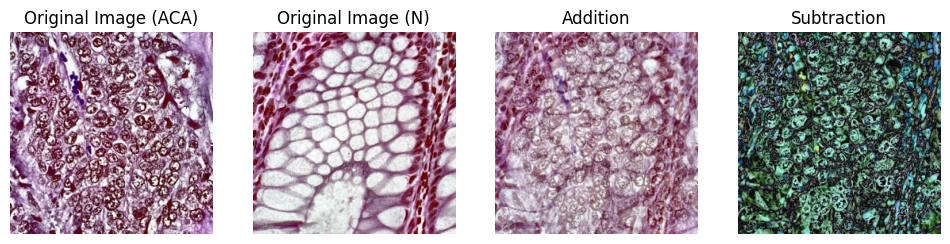

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


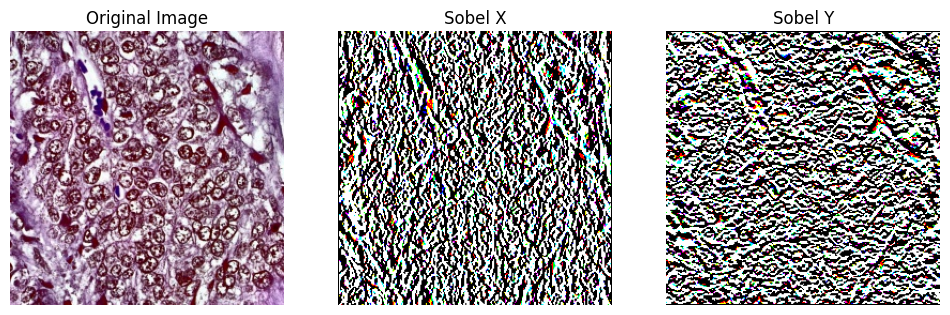

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


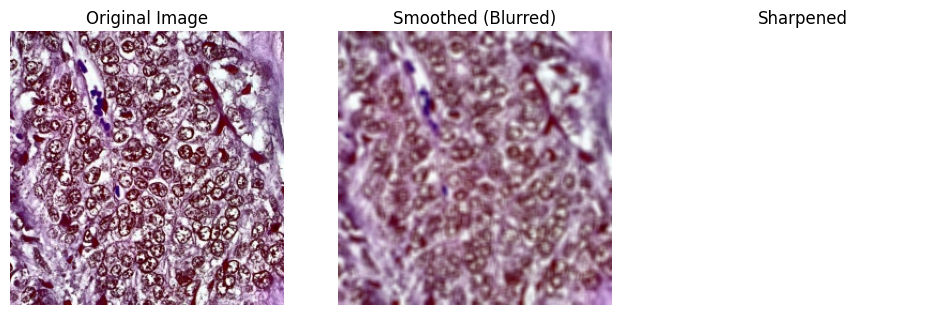

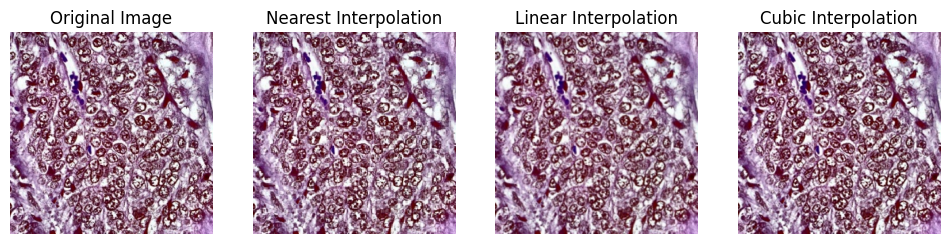

In [48]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to display images
def display_images(images, titles):
    plt.figure(figsize=(12, 6))
    for i in range(len(images)):
        plt.subplot(1, len(images), i + 1)
        plt.imshow(images[i])
        plt.title(titles[i])
        plt.axis('off')
    plt.show()

# Read the input images
image_path_aca = '/Users/jazlyn/dip project/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca/colonca1.jpeg'
image_path_n = '/Users/jazlyn/dip project/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_n/colonn1.jpeg'

image_aca = cv2.imread(image_path_aca)
image_n = cv2.imread(image_path_n)

# Apply arithmetic/logic operations
addition_result = cv2.addWeighted(image_aca, 0.5, image_n, 0.5, 0)
subtraction_result = cv2.absdiff(image_aca, image_n)

# Display the results of arithmetic/logic operations
display_images([image_aca, image_n, addition_result, subtraction_result],
               ['Original Image (ACA)', 'Original Image (N)', 'Addition', 'Subtraction'])

# Calculate image derivatives (Sobel operators)
sobel_x_aca = cv2.Sobel(image_aca, cv2.CV_64F, 1, 0, ksize=3)
sobel_y_aca = cv2.Sobel(image_aca, cv2.CV_64F, 0, 1, ksize=3)

# Display the image derivatives
display_images([image_aca, sobel_x_aca, sobel_y_aca],
               ['Original Image', 'Sobel X', 'Sobel Y'])

# Apply spatial convolution for smoothing and sharpening
kernel_size = 5
kernel = np.ones((kernel_size, kernel_size), np.float32) / (kernel_size**2)

smoothed_aca = cv2.filter2D(image_aca, -1, kernel)
sharpened_aca = cv2.filter2D(image_aca, -1, kernel) + 1.5 * (image_aca - smoothed_aca)

# Display the results of spatial convolution
display_images([image_aca, smoothed_aca, sharpened_aca],
               ['Original Image', 'Smoothed (Blurred)', 'Sharpened'])

# Implement image interpolation techniques
resized_aca_nearest = cv2.resize(image_aca, (300, 300), interpolation=cv2.INTER_NEAREST)
resized_aca_linear = cv2.resize(image_aca, (300, 300), interpolation=cv2.INTER_LINEAR)
resized_aca_cubic = cv2.resize(image_aca, (300, 300), interpolation=cv2.INTER_CUBIC)

# Display the results of image interpolation
display_images([image_aca, resized_aca_nearest, resized_aca_linear, resized_aca_cubic],
               ['Original Image', 'Nearest Interpolation', 'Linear Interpolation', 'Cubic Interpolation'])


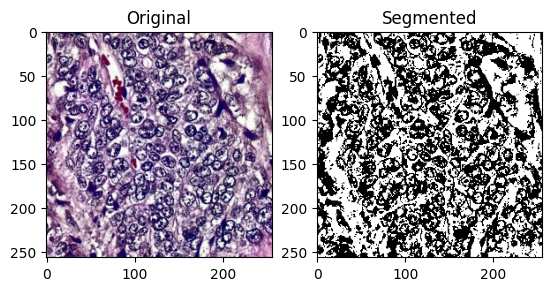

True

In [49]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load the denoised and restored image
img_path = '/Users/jazlyn/dip project/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca/colonca1.jpeg'
img = cv2.imread(img_path)

# Convert the image to grayscale
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Apply adaptive thresholding to segment the darkest regions (cells)
_, segmented_img = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Display the original and segmented images
plt.subplot(121), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original')
plt.subplot(122), plt.imshow(segmented_img, cmap='gray'), plt.title('Segmented')
plt.show()

# Save the segmented image
cv2.imwrite('segmented_cells.jpg', segmented_img)

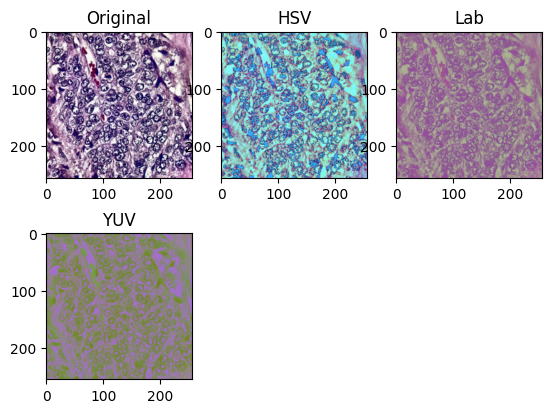

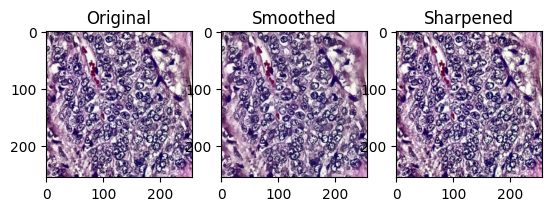

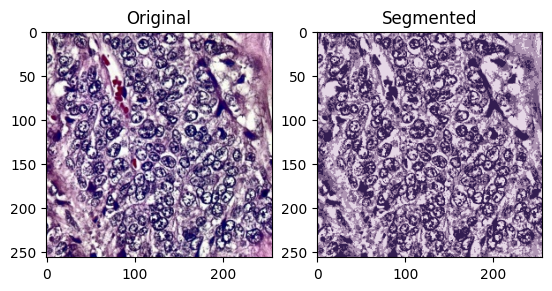

True

In [50]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load the denoised and restored image (assuming you have already denoised and restored the image)
img_path = '/Users/jazlyn/dip project/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca/colonca1.jpeg'
img_restored = cv2.imread(img_path)

# Convert the image to different color spaces
img_hsv = cv2.cvtColor(img_restored, cv2.COLOR_BGR2HSV)
img_lab = cv2.cvtColor(img_restored, cv2.COLOR_BGR2Lab)
img_yuv = cv2.cvtColor(img_restored, cv2.COLOR_BGR2YUV)

# Display the original and different color spaces
plt.subplot(231), plt.imshow(cv2.cvtColor(img_restored, cv2.COLOR_BGR2RGB)), plt.title('Original')
plt.subplot(232), plt.imshow(cv2.cvtColor(img_hsv, cv2.COLOR_RGB2HSV)), plt.title('HSV')
plt.subplot(233), plt.imshow(cv2.cvtColor(img_lab, cv2.COLOR_RGB2Lab)), plt.title('Lab')
plt.subplot(234), plt.imshow(cv2.cvtColor(img_yuv, cv2.COLOR_RGB2YUV)), plt.title('YUV')
plt.show()

# Smoothing and Sharpening in Color Space
# You can apply spatial domain techniques to each color channel
# Here, we'll use a simple bilateral filter for smoothing and unsharp masking for sharpening
img_smoothed = cv2.bilateralFilter(img_restored, 9, 75, 75)
img_sharpened = cv2.addWeighted(img_restored, 1.5, img_smoothed, -0.5, 0)

# Display the original, smoothed, and sharpened images
plt.subplot(131), plt.imshow(cv2.cvtColor(img_restored, cv2.COLOR_BGR2RGB)), plt.title('Original')
plt.subplot(132), plt.imshow(cv2.cvtColor(img_smoothed, cv2.COLOR_BGR2RGB)), plt.title('Smoothed')
plt.subplot(133), plt.imshow(cv2.cvtColor(img_sharpened, cv2.COLOR_BGR2RGB)), plt.title('Sharpened')
plt.show()

# Segmentation
# Implement segmentation techniques for identifying regions of interest
# Here, we'll use k-means clustering for segmentation
img_flat = img_restored.reshape((-1, 3))
img_flat = np.float32(img_flat)

# Define criteria and apply kmeans()
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
k = 4  # You can adjust the number of clusters based on your needs
_, labels, centers = cv2.kmeans(img_flat, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

# Convert back to 8-bit values
centers = np.uint8(centers)
segmented_img = centers[labels.flatten()]

# Reshape the segmented image to the original dimensions
segmented_img = segmented_img.reshape(img_restored.shape)

# Display the original and segmented images
plt.subplot(121), plt.imshow(cv2.cvtColor(img_restored, cv2.COLOR_BGR2RGB)), plt.title('Original')
plt.subplot(122), plt.imshow(cv2.cvtColor(segmented_img, cv2.COLOR_BGR2RGB)), plt.title('Segmented')
plt.show()

# Save the segmented image
cv2.imwrite('segmented_image.jpg', segmented_img)

# Morphological perations for segmentation

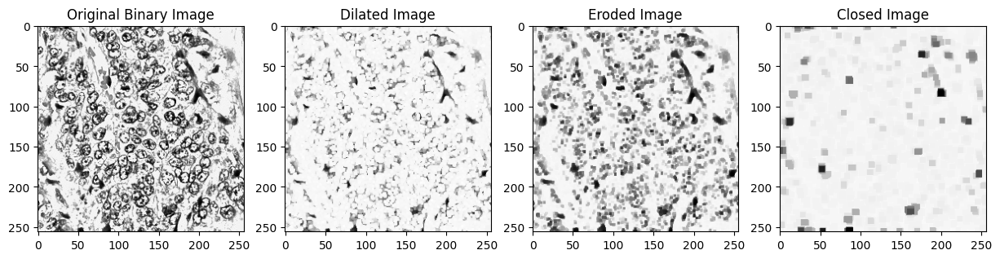

Morphological operations for segmentation applied.


In [58]:
import cv2
import os
import matplotlib.pyplot as plt

def apply_morphological_operations(image_path, output_folder):
    # Read the binary image
    binary_img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Check if the image is successfully loaded
    if binary_img is None:
        print(f"Error: Could not read the image at path {image_path}")
        return

    # Check if the image is empty
    if binary_img.size == 0:
        print(f"Error: The image at path {image_path} is empty")
        return

    # Apply morphological operations (dilation, erosion, closing)
    kernel_dilation = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    kernel_erosion = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    kernel_closing = cv2.getStructuringElement(cv2.MORPH_RECT, (7, 7))

    dilated_img = cv2.dilate(binary_img, kernel_dilation, iterations=1)
    eroded_img = cv2.erode(dilated_img, kernel_erosion, iterations=1)
    closed_img = cv2.morphologyEx(eroded_img, cv2.MORPH_CLOSE, kernel_closing)

    # Display the images at each step
    plt.figure(figsize=(15, 4))

    plt.subplot(1, 4, 1)
    plt.imshow(binary_img, cmap='gray')
    plt.title('Original Binary Image')

    plt.subplot(1, 4, 2)
    plt.imshow(dilated_img, cmap='gray')
    plt.title('Dilated Image')

    plt.subplot(1, 4, 3)
    plt.imshow(eroded_img, cmap='gray')
    plt.title('Eroded Image')

    plt.subplot(1, 4, 4)
    plt.imshow(closed_img, cmap='gray')
    plt.title('Closed Image')

    plt.show()

    # Save the segmented images
    filename = os.path.basename(image_path)
    output_path_dilated = os.path.join(output_folder, filename.replace('.jpeg', '_dilated.jpeg'))
    output_path_eroded = os.path.join(output_folder, filename.replace('.jpeg', '_eroded.jpeg'))
    output_path_closed = os.path.join(output_folder, filename.replace('.jpeg', '_closed.jpeg'))

    cv2.imwrite(output_path_dilated, dilated_img)
    cv2.imwrite(output_path_eroded, eroded_img)
    cv2.imwrite(output_path_closed, closed_img)

# Image path
image_path_segmentation = '/Users/jazlyn/dip project/thresholded/colon_acat/colon_aca/binary3/colonca1.jpeg'

# Output folder for segmented images
output_folder_segmentation = '/Users/jazlyn/dip project/morphoperations'

# Create output folder if it doesn't exist
os.makedirs(output_folder_segmentation, exist_ok=True)

# Apply morphological operations for segmentation
apply_morphological_operations(image_path_segmentation, output_folder_segmentation)

print("Morphological operations for segmentation applied.")


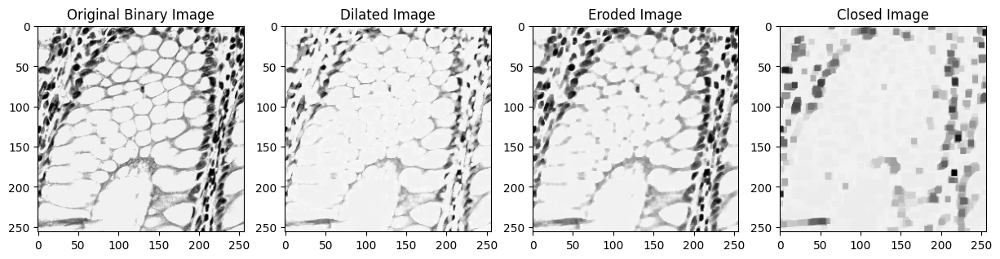

Morphological operations for segmentation applied.


In [59]:
import cv2
import os
import matplotlib.pyplot as plt

def apply_morphological_operations(image_path, output_folder):
    # Read the binary image
    binary_img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Check if the image is successfully loaded
    if binary_img is None:
        print(f"Error: Could not read the image at path {image_path}")
        return

    # Check if the image is empty
    if binary_img.size == 0:
        print(f"Error: The image at path {image_path} is empty")
        return

    # Apply morphological operations (dilation, erosion, closing)
    kernel_dilation = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    kernel_erosion = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    kernel_closing = cv2.getStructuringElement(cv2.MORPH_RECT, (7, 7))

    dilated_img = cv2.dilate(binary_img, kernel_dilation, iterations=1)
    eroded_img = cv2.erode(dilated_img, kernel_erosion, iterations=1)
    closed_img = cv2.morphologyEx(eroded_img, cv2.MORPH_CLOSE, kernel_closing)

    # Display the images at each step
    plt.figure(figsize=(15, 4))

    plt.subplot(1, 4, 1)
    plt.imshow(binary_img, cmap='gray')
    plt.title('Original Binary Image')

    plt.subplot(1, 4, 2)
    plt.imshow(dilated_img, cmap='gray')
    plt.title('Dilated Image')

    plt.subplot(1, 4, 3)
    plt.imshow(eroded_img, cmap='gray')
    plt.title('Eroded Image')

    plt.subplot(1, 4, 4)
    plt.imshow(closed_img, cmap='gray')
    plt.title('Closed Image')

    plt.show()

    # Save the segmented images
    filename = os.path.basename(image_path)
    output_path_dilated = os.path.join(output_folder, filename.replace('.jpeg', '_dilated.jpeg'))
    output_path_eroded = os.path.join(output_folder, filename.replace('.jpeg', '_eroded.jpeg'))
    output_path_closed = os.path.join(output_folder, filename.replace('.jpeg', '_closed.jpeg'))

    cv2.imwrite(output_path_dilated, dilated_img)
    cv2.imwrite(output_path_eroded, eroded_img)
    cv2.imwrite(output_path_closed, closed_img)

# Image path
image_path_segmentation = '/Users/jazlyn/dip project/thresholded/colon_nt/colon_n/binary3/colonn1.jpeg'

# Output folder for segmented images
output_folder_segmentation = '/Users/jazlyn/dip project/morphoperations'

# Create output folder if it doesn't exist
os.makedirs(output_folder_segmentation, exist_ok=True)

# Apply morphological operations for segmentation
apply_morphological_operations(image_path_segmentation, output_folder_segmentation)

print("Morphological operations for segmentation applied.")


# extracts contours, and calculates various morphological features such as area, perimeter, elongation, compactness, and the number of holes

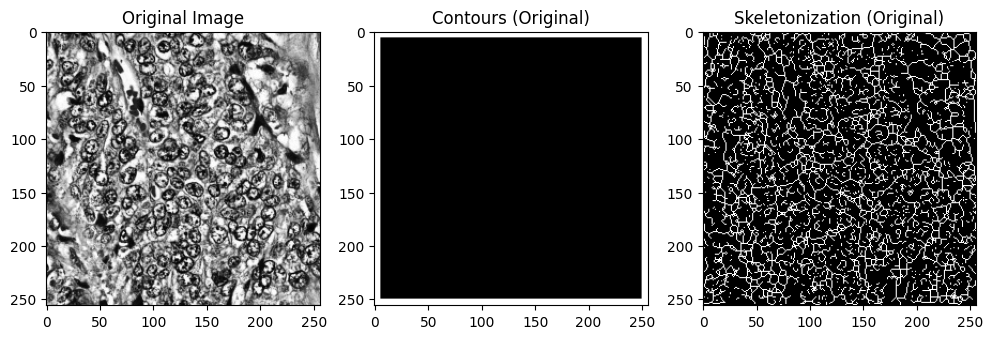

Original Image - Area: 65025.0, Perimeter: 1020.0, Elongation: 0.0013587870032316096, Compactness: 1.273239544719581, Number of Holes: 345


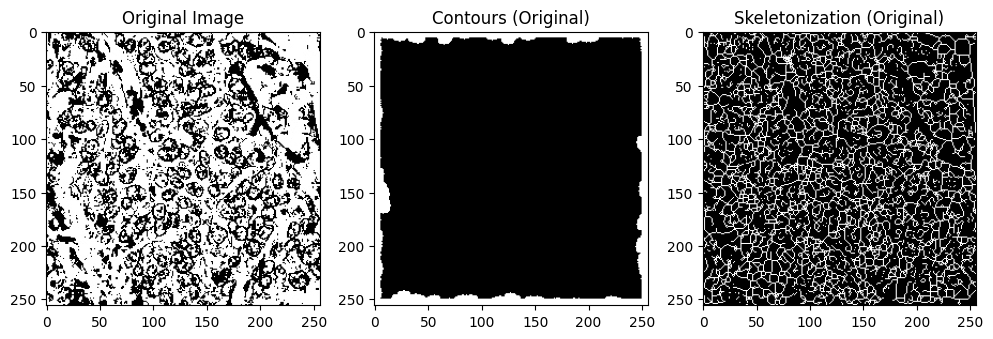

Original Image - Area: 64238.5, Perimeter: 1577.0651379823685, Elongation: 0.0013405296522953918, Compactness: 3.0810163823681136, Number of Holes: 659


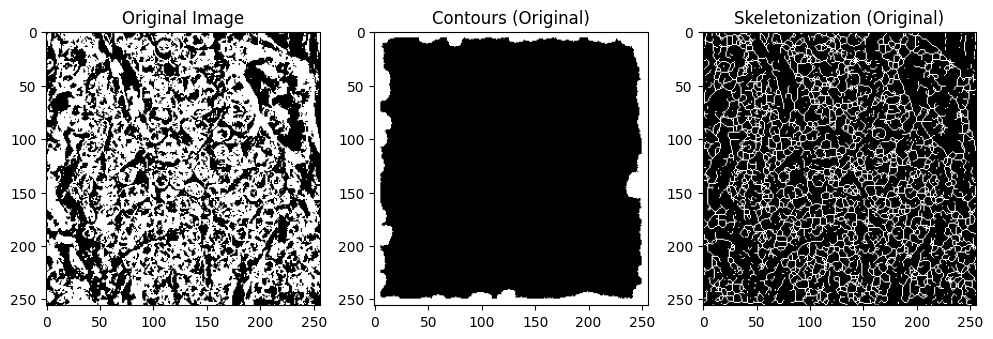

Original Image - Area: 63426.5, Perimeter: 2223.176958322525, Elongation: 0.0014410478024587303, Compactness: 6.201081716338143, Number of Holes: 615


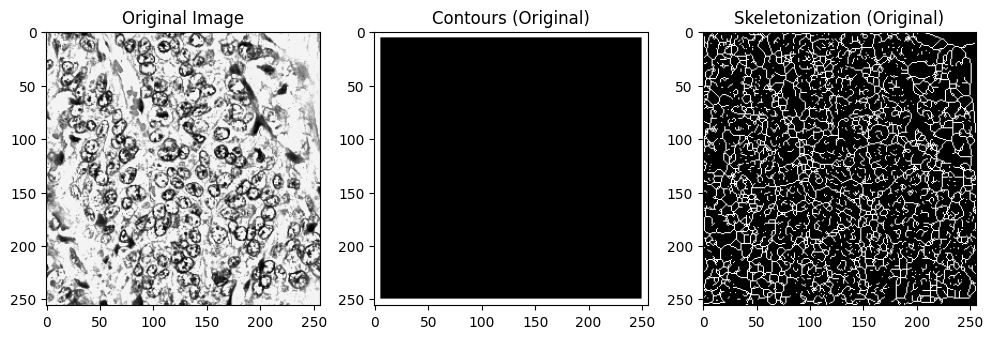

Original Image - Area: 65025.0, Perimeter: 1020.0, Elongation: 0.0015027899906179677, Compactness: 1.273239544719581, Number of Holes: 471


In [78]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.morphology import skeletonize

def extract_morphological_features(image_path):
    # Read the original image
    original_img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Find contours in the original image
    contours_original, _ = cv2.findContours(original_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create a black image to draw contours
    contour_img_original = np.zeros_like(original_img)

    # Draw contours on the black image
    cv2.drawContours(contour_img_original, contours_original, -1, (255), 10)

    # Calculate area and perimeter of the segmented regions in the original image
    total_area_original = 0
    perimeter_original = 0

    for contour in contours_original:
        total_area_original += cv2.contourArea(contour)
        perimeter_original += cv2.arcLength(contour, True)

    _, binary_skeleton_original = cv2.threshold(original_img, 127, 255, cv2.THRESH_BINARY)

    # Use skeletonize from skimage.morphology for skeletonization
    skeleton_original = skeletonize(binary_skeleton_original)

    elongation_original = np.sum(skeleton_original) / (np.sum(original_img) + 1e-5)

    # Calculate compactness using area and perimeter in the original image
    compactness_original = (perimeter_original ** 2) / (4 * np.pi * total_area_original + 1e-5)

    # Detect and count holes in structures in the original image
    _, binary_inv_original = cv2.threshold(original_img, 127, 255, cv2.THRESH_BINARY_INV)
    _, holes_img_original = cv2.connectedComponents(binary_inv_original)
    num_holes_original = np.max(holes_img_original)

    # Display the original and contour images
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(original_img, cmap='gray')
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(contour_img_original, cmap='gray')
    plt.title('Contours (Original)')

    plt.subplot(1, 3, 3)
    plt.imshow(skeleton_original, cmap='gray')
    plt.title('Skeletonization (Original)')

    plt.show()

    print(f"Original Image - Area: {total_area_original}, Perimeter: {perimeter_original}, Elongation: {elongation_original}, Compactness: {compactness_original}, Number of Holes: {num_holes_original}")

# List of image paths
image_paths = [
    '/Users/jazlyn/dip project/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca/colonca1.jpeg',
    '/Users/jazlyn/dip project/thresholded/colon_acat/colon_aca/binary1/colonca1.jpeg',
    '/Users/jazlyn/dip project/thresholded/colon_acat/colon_aca/binary2/colonca1.jpeg',
    '/Users/jazlyn/dip project/thresholded/colon_acat/colon_aca/binary3/colonca1.jpeg',
]

# Extract and compare features for each image
for image_path in image_paths:
    extract_morphological_features(image_path)



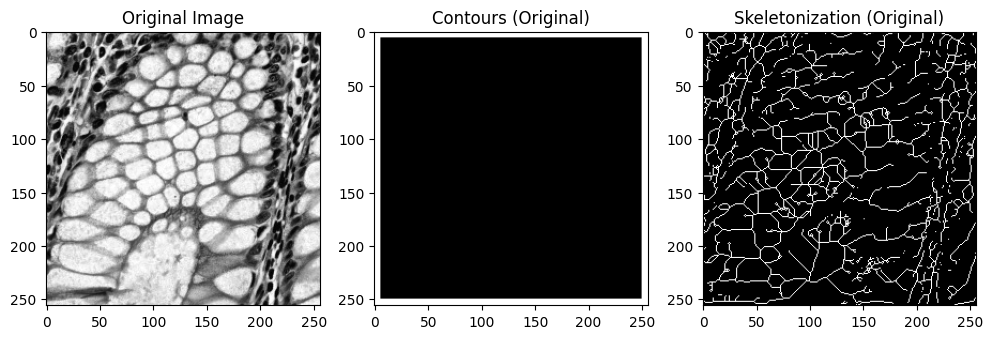

Original Image - Area: 65025.0, Perimeter: 1020.0, Elongation: 0.0006093165469584069, Compactness: 1.273239544719581, Number of Holes: 131


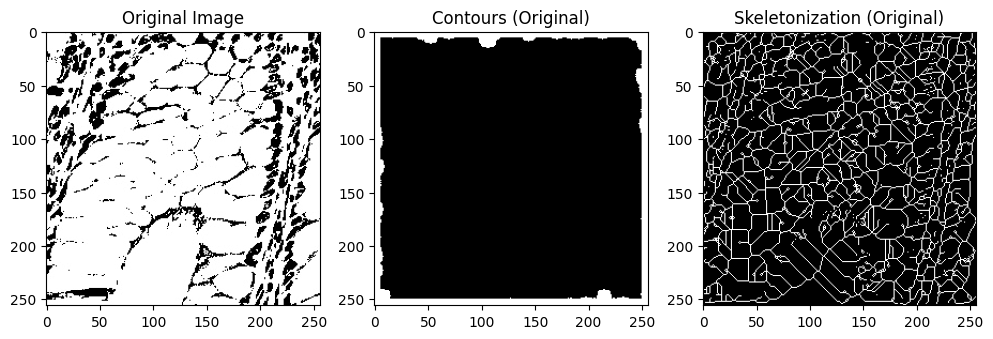

Original Image - Area: 64626.0, Perimeter: 1320.3818114995956, Elongation: 0.0007135583585330029, Compactness: 2.146752246901296, Number of Holes: 386


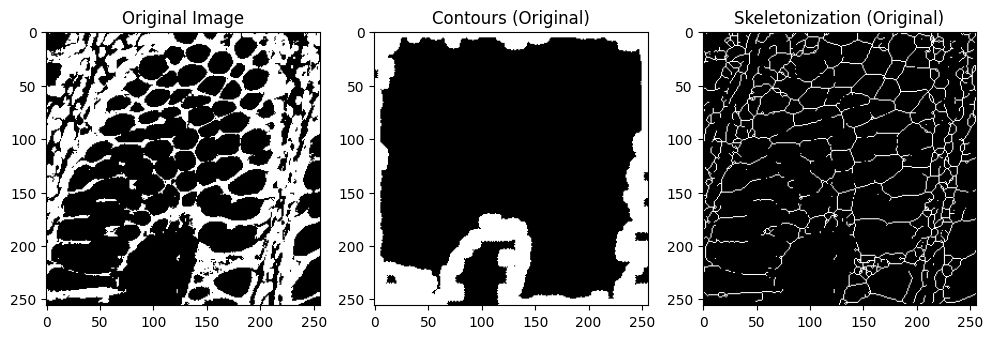

Original Image - Area: 56616.0, Perimeter: 3579.570085287094, Elongation: 0.0009462600706085109, Compactness: 18.00995772379226, Number of Holes: 138


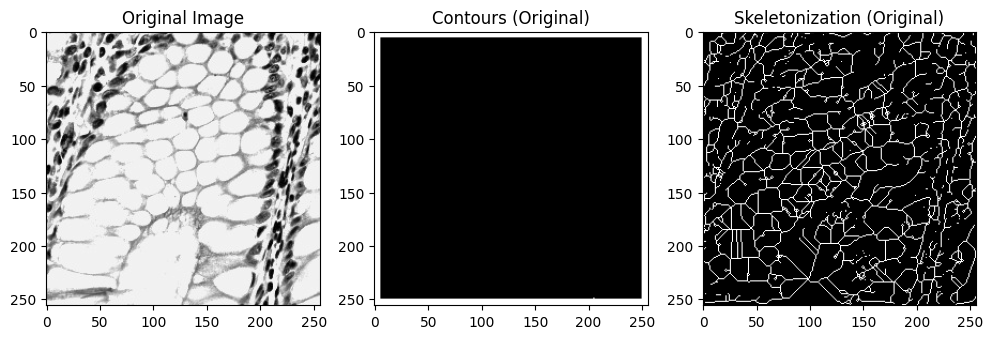

Original Image - Area: 65024.0, Perimeter: 1020.8284270763397, Elongation: 0.0008132864185355987, Compactness: 1.275328205557941, Number of Holes: 190


In [79]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.morphology import skeletonize

def extract_morphological_features(image_path):
    # Read the original image
    original_img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Find contours in the original image
    contours_original, _ = cv2.findContours(original_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create a black image to draw contours
    contour_img_original = np.zeros_like(original_img)

    # Draw contours on the black image
    cv2.drawContours(contour_img_original, contours_original, -1, (255), 10)

    # Calculate area and perimeter of the segmented regions in the original image
    total_area_original = 0
    perimeter_original = 0

    for contour in contours_original:
        total_area_original += cv2.contourArea(contour)
        perimeter_original += cv2.arcLength(contour, True)

    _, binary_skeleton_original = cv2.threshold(original_img, 127, 255, cv2.THRESH_BINARY)

    # Use skeletonize from skimage.morphology for skeletonization
    skeleton_original = skeletonize(binary_skeleton_original)

    elongation_original = np.sum(skeleton_original) / (np.sum(original_img) + 1e-5)

    # Calculate compactness using area and perimeter in the original image
    compactness_original = (perimeter_original ** 2) / (4 * np.pi * total_area_original + 1e-5)

    # Detect and count holes in structures in the original image
    _, binary_inv_original = cv2.threshold(original_img, 127, 255, cv2.THRESH_BINARY_INV)
    _, holes_img_original = cv2.connectedComponents(binary_inv_original)
    num_holes_original = np.max(holes_img_original)

    # Display the original and contour images
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(original_img, cmap='gray')
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(contour_img_original, cmap='gray')
    plt.title('Contours (Original)')

    plt.subplot(1, 3, 3)
    plt.imshow(skeleton_original, cmap='gray')
    plt.title('Skeletonization (Original)')

    plt.show()

    print(f"Original Image - Area: {total_area_original}, Perimeter: {perimeter_original}, Elongation: {elongation_original}, Compactness: {compactness_original}, Number of Holes: {num_holes_original}")

# List of image paths
image_paths = [
    '/Users/jazlyn/dip project/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_n/colonn1.jpeg',
    '/Users/jazlyn/dip project/thresholded/colon_nt/colon_n/binary1/colonn1.jpeg',
    '/Users/jazlyn/dip project/thresholded/colon_nt/colon_n/binary2/colonn1.jpeg',
    '/Users/jazlyn/dip project/thresholded/colon_nt/colon_n/binary3/colonn1.jpeg',
]

# Extract and compare features for each image
for image_path in image_paths:
    extract_morphological_features(image_path)



# result : skeletonization is bestdefined for binary 3 and number of holes detected is most or teh orginal enhanced image and least for binary 2

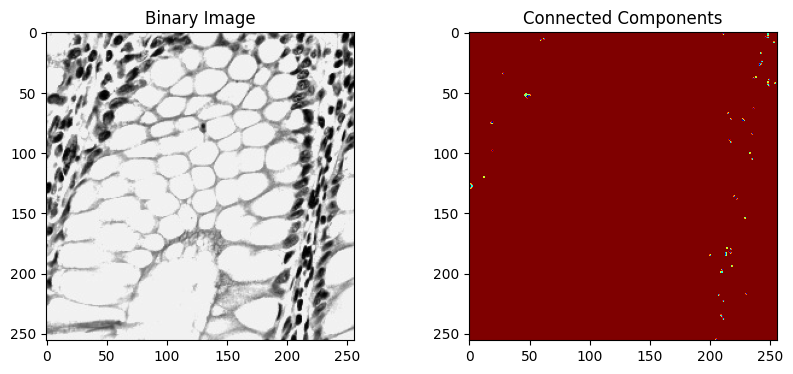

In [80]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def connected_component_analysis(binary_image):
    # Apply connected components analysis
    _, labels = cv2.connectedComponents(binary_image)

    # Visualize connected components
    unique_labels = np.unique(labels)
    segmented_image = np.zeros_like(labels)

    for label in unique_labels:
        if label == 0:
            continue  # Background label
        component_mask = (labels == label).astype(np.uint8)
        segmented_image += component_mask * label

    return segmented_image

# Example usage
image_path = '/Users/jazlyn/dip project/thresholded/colon_nt/colon_n/binary3/colonn1.jpeg'
binary_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply connected component analysis
segmented_image = connected_component_analysis(binary_image)

# Display results
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.imshow(binary_image, cmap='gray')
plt.title('Binary Image')

plt.subplot(1, 2, 2)
plt.imshow(segmented_image, cmap='jet')  # 'jet' colormap for better visualization of components
plt.title('Connected Components')

plt.show()

# texture analysis

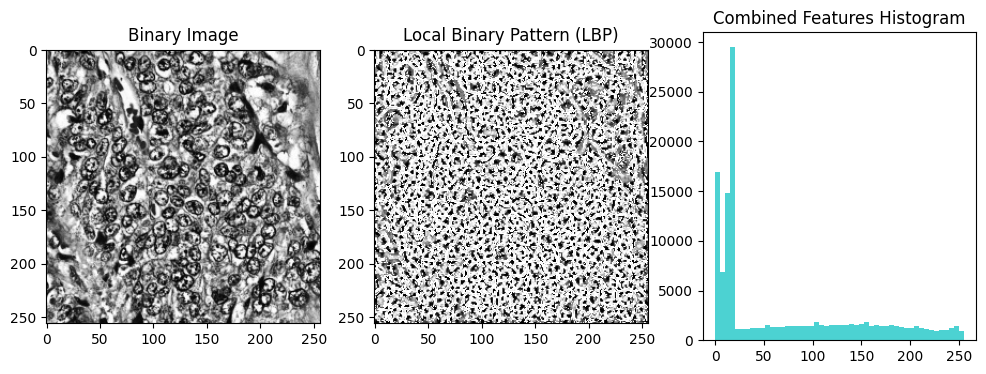

Combined Features Shape: (131072,)
--------------------------------------------------


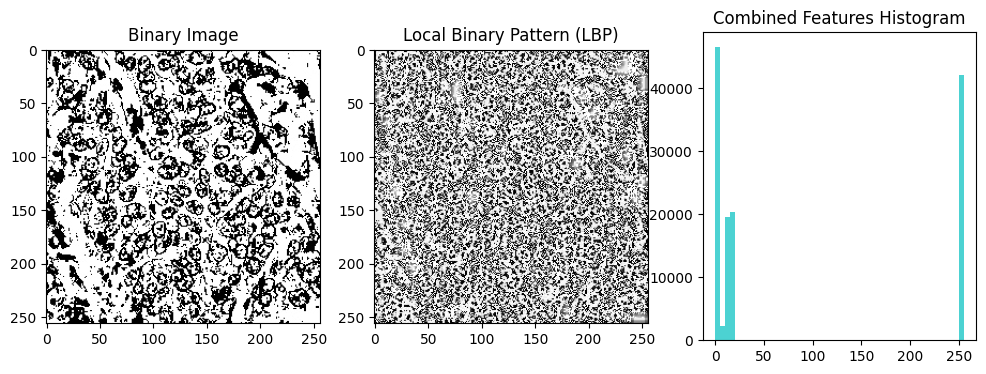

Combined Features Shape: (131072,)
--------------------------------------------------


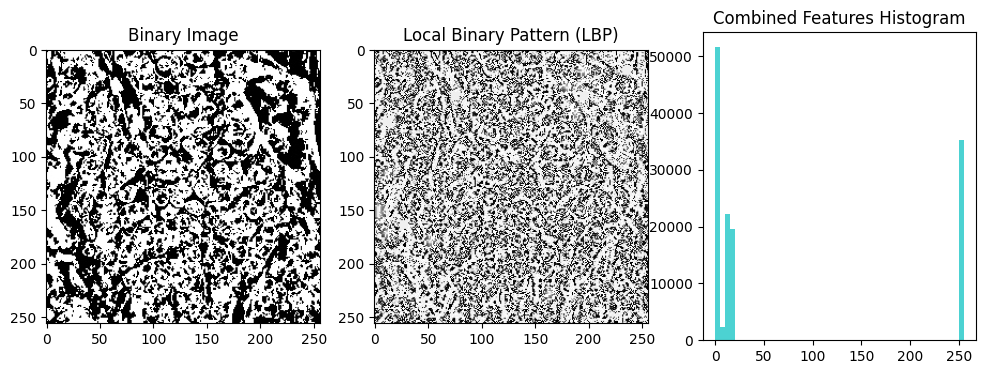

Combined Features Shape: (131072,)
--------------------------------------------------


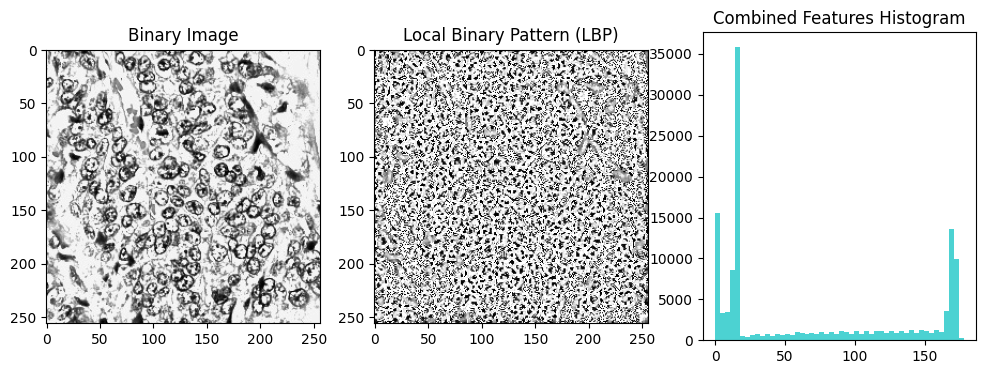

Combined Features Shape: (131072,)
--------------------------------------------------


In [84]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import local_binary_pattern

def texture_analysis(image_path):
    # Read the binary image
    binary_img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Apply Local Binary Pattern (LBP) for texture analysis
    radius = 3
    n_points = 5 * radius
    lbp_img = local_binary_pattern(binary_img, n_points, radius, method='uniform')

    # Combine morphological features with LBP
    combined_features = np.concatenate([binary_img.flatten(), lbp_img.flatten()])

    # Display results
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(binary_img, cmap='gray')
    plt.title('Binary Image')

    plt.subplot(1, 3, 2)
    plt.imshow(lbp_img, cmap='gray')
    plt.title('Local Binary Pattern (LBP)')

    plt.subplot(1, 3, 3)
    plt.hist(combined_features, bins=50, color='c', alpha=0.7)
    plt.title('Combined Features Histogram')

    plt.show()

    return combined_features

# List of image paths
image_paths = [
    '/Users/jazlyn/dip project/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca/colonca1.jpeg',
    '/Users/jazlyn/dip project/thresholded/colon_acat/colon_aca/binary1/colonca1.jpeg',
    '/Users/jazlyn/dip project/thresholded/colon_acat/colon_aca/binary2/colonca1.jpeg',
    '/Users/jazlyn/dip project/thresholded/colon_acat/colon_aca/binary3/colonca1.jpeg',

]

# Apply texture analysis to each image
for image_path in image_paths:
    combined_features = texture_analysis(image_path)
    print("Combined Features Shape:", combined_features.shape)
    print("-" * 50)





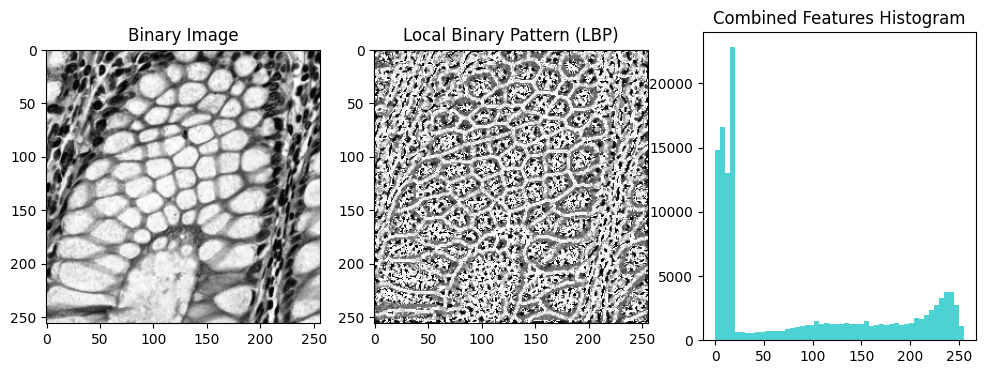

Combined Features Shape: (131072,)
--------------------------------------------------


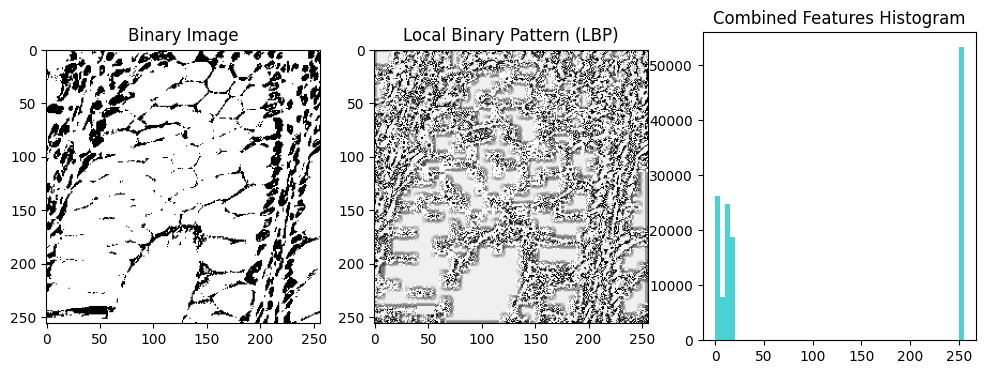

Combined Features Shape: (131072,)
--------------------------------------------------


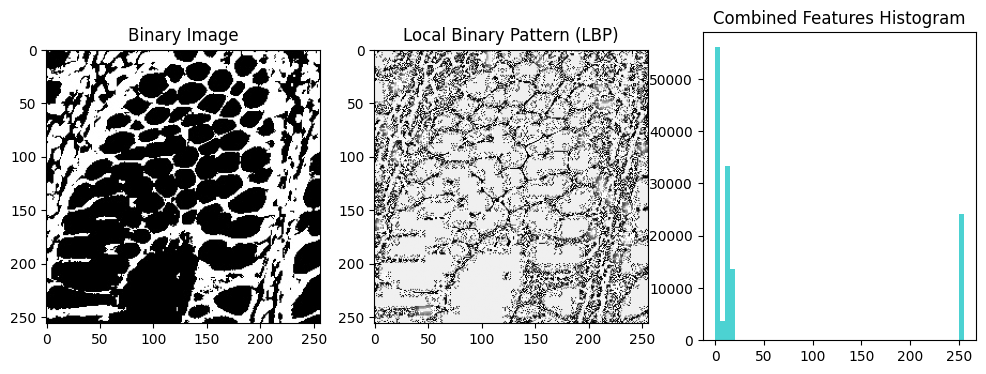

Combined Features Shape: (131072,)
--------------------------------------------------


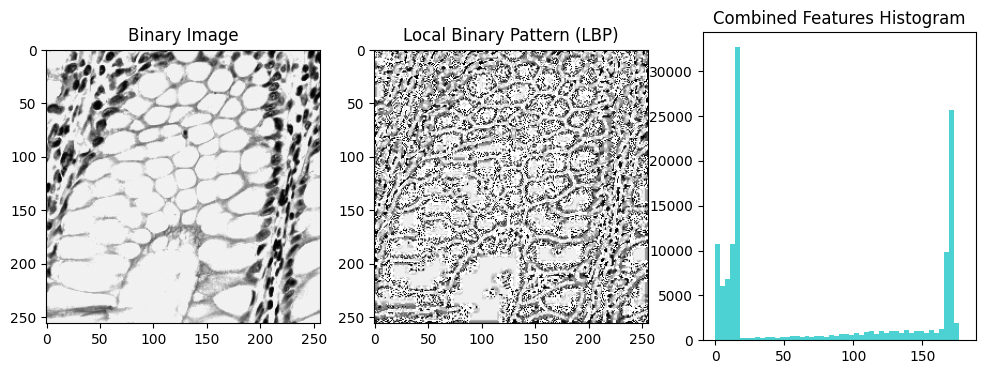

Combined Features Shape: (131072,)
--------------------------------------------------


In [85]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import local_binary_pattern

def texture_analysis(image_path):
    # Read the binary image
    binary_img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Apply Local Binary Pattern (LBP) for texture analysis
    radius = 3
    n_points = 5 * radius
    lbp_img = local_binary_pattern(binary_img, n_points, radius, method='uniform')

    # Combine morphological features with LBP
    combined_features = np.concatenate([binary_img.flatten(), lbp_img.flatten()])

    # Display results
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(binary_img, cmap='gray')
    plt.title('Binary Image')

    plt.subplot(1, 3, 2)
    plt.imshow(lbp_img, cmap='gray')
    plt.title('Local Binary Pattern (LBP)')

    plt.subplot(1, 3, 3)
    plt.hist(combined_features, bins=50, color='c', alpha=0.7)
    plt.title('Combined Features Histogram')

    plt.show()

    return combined_features

# List of image paths
image_paths = [
    '/Users/jazlyn/dip project/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_n/colonn1.jpeg',
    '/Users/jazlyn/dip project/thresholded/colon_nt/colon_n/binary1/colonn1.jpeg',
    '/Users/jazlyn/dip project/thresholded/colon_nt/colon_n/binary2/colonn1.jpeg',
    '/Users/jazlyn/dip project/thresholded/colon_nt/colon_n/binary3/colonn1.jpeg',

]

# Apply texture analysis to each image
for image_path in image_paths:
    combined_features = texture_analysis(image_path)
    print("Combined Features Shape:", combined_features.shape)
    print("-" * 50)

# extracting features

In [96]:
import cv2
import os
import numpy as np
from skimage.morphology import skeletonize
from skimage.feature import local_binary_pattern
import matplotlib.pyplot as plt

def extract_morphological_features(img):
    # Calculate elongation using skeletonization in the original image
    _, binary_skeleton_original = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)

    # Use skeletonize from skimage.morphology for skeletonization
    skeleton_original = skeletonize(binary_skeleton_original)

    elongation_original = np.sum(skeleton_original) / (np.sum(img) + 1e-5)

    # Calculate compactness using area and perimeter in the original image
    _, binary_inv_original = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY_INV)
    _, contours_original, _ = cv2.findContours(binary_inv_original, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    area_original = np.sum(cv2.contourArea(contour) for contour in contours_original)
    perimeter_original = np.sum(cv2.arcLength(contour, True) for contour in contours_original)
    compactness_original = (perimeter_original ** 2) / (4 * np.pi * area_original + 1e-5)

    # Detect and count holes in structures in the original image
    _, holes_img_original = cv2.connectedComponents(binary_inv_original)
    num_holes_original = np.max(holes_img_original)

    return elongation_original, compactness_original, num_holes_original

def texture_analysis(img):
    # Apply Local Binary Pattern (LBP) for texture analysis
    radius = 3
    n_points = 5 * radius
    lbp_img = local_binary_pattern(img, n_points, radius, method='uniform')

    # Combine morphological features with LBP
    combined_features = np.concatenate([img.flatten(), lbp_img.flatten()])

    return combined_features

def extract_and_save_features(input_folder, output_folder):
    # Loop over each subfolder (colon_acat, colon_nt)
    for subfolder in os.listdir(input_folder):
        subfolder_path = os.path.join(input_folder, subfolder)
        output_subfolder = os.path.join(output_folder, subfolder)

        # Create output folder for the subfolder if it doesn't exist
        os.makedirs(output_subfolder, exist_ok=True)

        # Loop over each sub-subfolder (binary2, binary3)
        for binary_folder in os.listdir(subfolder_path):
            if binary_folder not in ['binary2', 'binary3']:
                continue

            binary_folder_path = os.path.join(subfolder_path, binary_folder)
            output_binary_folder = os.path.join(output_subfolder, binary_folder)

            os.makedirs(output_binary_folder, exist_ok=True)

            # Get the list of image paths in the binary folder
            image_paths = [os.path.join(binary_folder_path, filename) for filename in os.listdir(binary_folder_path) if filename.endswith(('.jpeg', '.jpg'))]

            print(f"Processing {binary_folder} images in {subfolder} subfolder.")
            print(f"Found {len(image_paths)} images.")

            # Loop over each image in the binary folder
            for image_path in image_paths:
                print(f"Processing image: {image_path}")
                # Read the image
                img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

                if img is None:
                    print(f"Unable to read image: {image_path}")
                    continue

                # Extract morphological features
                morphological_features = extract_morphological_features(img)

                # Apply texture analysis
                texture_features = texture_analysis(img)

                # Combine all features
                combined_features = np.concatenate([img.flatten(), morphological_features, texture_features])

                # Save combined features
                output_path = os.path.join(output_binary_folder, f'features_{os.path.basename(image_path)}.npy')
                np.save(output_path, combined_features)
                print(f"Features saved for {os.path.basename(image_path)} at {output_path}")

# Specify input and output folders
input_folder = '/Users/jazlyn/dip project/thresholded'
output_folder = '/Users/jazlyn/dip project/extracted_features'

# Extract features for each subfolder and save in the corresponding output folder
extract_and_save_features(input_folder, output_folder)


In [111]:
import cv2
import os
import numpy as np
from skimage.morphology import skeletonize
from skimage.feature import local_binary_pattern

def extract_morphological_features(img):
    _, binary_skeleton_original = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)
    skeleton_original = skeletonize(binary_skeleton_original)
    elongation_original = np.sum(skeleton_original) / (np.sum(img) + 1e-5)

    _, binary_inv_original = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY_INV)
    contours_original, _ = cv2.findContours(binary_inv_original, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    area_original = np.sum(cv2.contourArea(contour) for contour in contours_original)
    perimeter_original = np.sum(cv2.arcLength(contour, True) for contour in contours_original)
    compactness_original = (perimeter_original ** 2) / (4 * np.pi * area_original + 1e-5)

    _, holes_img_original = cv2.connectedComponents(binary_inv_original)
    num_holes_original = np.max(holes_img_original)

    return elongation_original, compactness_original, num_holes_original

def texture_analysis(img):
    radius = 3
    n_points = 5 * radius
    lbp_img = local_binary_pattern(img, n_points, radius, method='uniform')
    combined_features = np.concatenate([img.flatten(), lbp_img.flatten()])
    return combined_features

def extract_and_save_features(input_folder, output_folder):
    for subfolder in os.listdir(input_folder):
        subfolder_path = os.path.join(input_folder, subfolder)
        output_subfolder = os.path.join(output_folder, subfolder)
        os.makedirs(output_subfolder, exist_ok=True)

        for binary_folder in ['binary2', 'binary3']:
            binary_folder_path = os.path.join(subfolder_path, 'colon_aca', binary_folder) if 'colon_aca' in subfolder else os.path.join(subfolder_path, 'colon_n', binary_folder)
            output_binary_folder = os.path.join(output_subfolder, binary_folder)
            os.makedirs(output_binary_folder, exist_ok=True)

            file_list = [f for f in os.listdir(binary_folder_path) if f.endswith(('.jpeg', '.jpg'))]

            if not file_list:
                print(f"No images found in {binary_folder_path}")
                continue

            for filename in file_list:
                image_path = os.path.join(binary_folder_path, filename)
                print(f"Processing image: {image_path}")
                img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

                if img is None:
                    print(f"Unable to read image: {image_path}")
                    continue

                morphological_features = extract_morphological_features(img)
                texture_features = texture_analysis(img)
                combined_features = np.concatenate([img.flatten(), morphological_features, texture_features])

                output_path = os.path.join(output_binary_folder, f'features_{os.path.basename(image_path)}.npy')
                np.save(output_path, combined_features)
                print(f"Features saved for {os.path.basename(image_path)} at {output_path}")

# Specify input and output folders
input_folder = '/Users/jazlyn/dip project/thresholded'
output_folder = '/Users/jazlyn/dip project/extracted_features'

# Extract features for each subfolder and save in the corresponding output folder
extract_and_save_features(input_folder, output_folder)



Processing image: /Users/jazlyn/dip project/thresholded/colon_acat/colon_aca/binary2/colonca3421.jpeg
Features saved for colonca3421.jpeg at /Users/jazlyn/dip project/extracted_features/colon_acat/binary2/features_colonca3421.jpeg.npy
Processing image: /Users/jazlyn/dip project/thresholded/colon_acat/colon_aca/binary2/colonca3071.jpeg
Features saved for colonca3071.jpeg at /Users/jazlyn/dip project/extracted_features/colon_acat/binary2/features_colonca3071.jpeg.npy
Processing image: /Users/jazlyn/dip project/thresholded/colon_acat/colon_aca/binary2/colonca2230.jpeg
Features saved for colonca2230.jpeg at /Users/jazlyn/dip project/extracted_features/colon_acat/binary2/features_colonca2230.jpeg.npy
Processing image: /Users/jazlyn/dip project/thresholded/colon_acat/colon_aca/binary2/colonca3972.jpeg
Features saved for colonca3972.jpeg at /Users/jazlyn/dip project/extracted_features/colon_acat/binary2/features_colonca3972.jpeg.npy
Processing image: /Users/jazlyn/dip project/thresholded/colo

/var/folders/2s/dv36fzps00125mc_rszwwyfm0000gn/T/ipykernel_6758/4116634339.py:15: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  area_original = np.sum(cv2.contourArea(contour) for contour in contours_original)
/var/folders/2s/dv36fzps00125mc_rszwwyfm0000gn/T/ipykernel_6758/4116634339.py:16: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  perimeter_original = np.sum(cv2.arcLength(contour, True) for contour in contours_original)


Features saved for colonca3564.jpeg at /Users/jazlyn/dip project/extracted_features/colon_acat/binary2/features_colonca3564.jpeg.npy
Processing image: /Users/jazlyn/dip project/thresholded/colon_acat/colon_aca/binary2/colonca1559.jpeg
Features saved for colonca1559.jpeg at /Users/jazlyn/dip project/extracted_features/colon_acat/binary2/features_colonca1559.jpeg.npy
Processing image: /Users/jazlyn/dip project/thresholded/colon_acat/colon_aca/binary2/colonca3134.jpeg
Features saved for colonca3134.jpeg at /Users/jazlyn/dip project/extracted_features/colon_acat/binary2/features_colonca3134.jpeg.npy
Processing image: /Users/jazlyn/dip project/thresholded/colon_acat/colon_aca/binary2/colonca1109.jpeg
Features saved for colonca1109.jpeg at /Users/jazlyn/dip project/extracted_features/colon_acat/binary2/features_colonca1109.jpeg.npy
Processing image: /Users/jazlyn/dip project/thresholded/colon_acat/colon_aca/binary2/colonca4921.jpeg
Features saved for colonca4921.jpeg at /Users/jazlyn/dip pro

KeyboardInterrupt: 

In [7]:
import os
import numpy as np
import cv2
import pandas as pd
from skimage.morphology import skeletonize
from skimage.feature import local_binary_pattern
from sklearn.preprocessing import LabelEncoder
import random


def extract_morphological_features(img):
    _, binary_skeleton_original = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)
    skeleton_original = skeletonize(binary_skeleton_original)
    elongation_original = np.sum(skeleton_original) / (np.sum(img) + 1e-5)

    _, binary_inv_original = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY_INV)
    contours_original, _ = cv2.findContours(binary_inv_original, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    area_original = np.sum(cv2.contourArea(contour) for contour in contours_original)
    perimeter_original = np.sum(cv2.arcLength(contour, True) for contour in contours_original)
    compactness_original = (perimeter_original ** 2) / (4 * np.pi * area_original + 1e-5)

    _, holes_img_original = cv2.connectedComponents(binary_inv_original)
    num_holes_original = np.max(holes_img_original)

    return elongation_original, compactness_original, num_holes_original

def texture_analysis(img):
    radius = 3
    n_points = 5 * radius
    lbp_img = local_binary_pattern(img, n_points, radius, method='uniform')
    return lbp_img.flatten()

def extract_and_save_features(input_folder, output_folder, num_samples=1000):
    feature_list = []
    labels = []

    for subfolder in os.listdir(input_folder):
        subfolder_path = os.path.join(input_folder, subfolder)
        output_subfolder = os.path.join(output_folder, subfolder)
        os.makedirs(output_subfolder, exist_ok=True)

        for binary_folder in ['binary3']:
            binary_folder_path = os.path.join(subfolder_path, 'colon_aca', binary_folder) if 'colon_aca' in subfolder else os.path.join(subfolder_path, 'colon_n', binary_folder)
            output_binary_folder = os.path.join(output_subfolder, binary_folder)
            os.makedirs(output_binary_folder, exist_ok=True)

            file_list = [f for f in os.listdir(binary_folder_path) if f.endswith(('.jpeg', '.jpg'))]

            if not file_list:
                continue

            # Randomly select num_samples images
            selected_files = random.sample(file_list, min(num_samples, len(file_list)))

            for filename in selected_files:
                image_path = os.path.join(binary_folder_path, filename)
                img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

                if img is None:
                    continue

                morphological_features = extract_morphological_features(img)
                texture_features = texture_analysis(img)

                combined_features = np.concatenate([morphological_features, texture_features])

                feature_list.append(combined_features)
                labels.append(subfolder.lower())  # Assuming the subfolder name is the label

    # Create DataFrame
    columns = ['elongation', 'compactness', 'num_holes', 'lbp']
    df = pd.DataFrame(feature_list, columns=columns)
    df['labels'] = labels
    df['filename'] = selected_files

    # Encode labels
    label_encoder = LabelEncoder()
    df['encoded_labels'] = label_encoder.fit_transform(df['labels'])

    # Save the DataFrame
    df.to_csv(os.path.join(output_folder, 'extracted_features.csv'), index=False)
    print("Features saved in DataFrame.")

# Specify input and output folders
input_folder = '/Users/jazlyn/dip project/thresholded'
output_folder = '//Users/jazlyn/dip project/extracted_features2'

# Extract features for each subfolder and save in the corresponding output folder
extract_and_save_features(input_folder, output_folder)


/var/folders/2s/dv36fzps00125mc_rszwwyfm0000gn/T/ipykernel_1309/126095541.py:19: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  area_original = np.sum(cv2.contourArea(contour) for contour in contours_original)
/var/folders/2s/dv36fzps00125mc_rszwwyfm0000gn/T/ipykernel_1309/126095541.py:20: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  perimeter_original = np.sum(cv2.arcLength(contour, True) for contour in contours_original)


ValueError: 4 columns passed, passed data had 65539 columns

**1000 images from binary3 in both colon_acat and colon_nt and saves the features for a total of 2000 images in the extracted_features folder. only extracts the number of holes, skeletonized array, and local binary pattern, reduced image size further, reduced precision of features instead of float64, float16 to reduce the size of the files**

In [118]:
import os
import numpy as np
import cv2
import random
from skimage.morphology import skeletonize
from skimage.feature import local_binary_pattern

def extract_morphological_features(img):
    _, binary_skeleton_original = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)

    # Use skeletonize from skimage.morphology for skeletonization
    skeleton_original = skeletonize(binary_skeleton_original)

    elongation_original = np.sum(skeleton_original) / (np.sum(img) + 1e-5)

    _, binary_inv_original = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY_INV)
    contours_original, _ = cv2.findContours(binary_inv_original, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    area_original = np.sum(cv2.contourArea(contour) for contour in contours_original)
    perimeter_original = np.sum(cv2.arcLength(contour, True) for contour in contours_original)
    compactness_original = (perimeter_original ** 2) / (4 * np.pi * area_original + 1e-5)

    _, holes_img_original = cv2.connectedComponents(binary_inv_original)
    num_holes_original = np.max(holes_img_original)

    # Create a 1D array with all features
    features = np.array([num_holes_original, elongation_original, compactness_original])

    return features



def texture_analysis(img):
    radius = 3
    n_points = 5 * radius
    lbp_img = local_binary_pattern(img, n_points, radius, method='uniform')
    return lbp_img.flatten()

def extract_and_save_features(input_folder, output_folder, num_samples=1000):
    for subfolder in os.listdir(input_folder):
        subfolder_path = os.path.join(input_folder, subfolder)
        output_subfolder = os.path.join(output_folder, subfolder)
        os.makedirs(output_subfolder, exist_ok=True)

        for binary_folder in ['binary3']:
            binary_folder_path = os.path.join(subfolder_path, 'colon_aca', binary_folder) if 'colon_aca' in subfolder else os.path.join(subfolder_path, 'colon_n', binary_folder)
            output_binary_folder = os.path.join(output_subfolder, binary_folder)
            os.makedirs(output_binary_folder, exist_ok=True)

            file_list = [f for f in os.listdir(binary_folder_path) if f.endswith(('.jpeg', '.jpg'))]

            if not file_list:
                continue

            # Randomly select num_samples images
            selected_files = random.sample(file_list, min(num_samples, len(file_list)))

            for filename in selected_files:
                image_path = os.path.join(binary_folder_path, filename)
                img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

                if img is None:
                    continue

                morphological_features = extract_morphological_features(img)
                texture_features = texture_analysis(img)

                combined_features = np.concatenate([morphological_features, texture_features])

                output_path = os.path.join(output_binary_folder, f'features_{os.path.basename(image_path)}.npy')
                np.save(output_path, combined_features)

    print("Features extracted and saved successfully.")

# Specify input and output folders
input_folder = '/Users/jazlyn/dip project/thresholded'
output_folder = '/Users/jazlyn/dip project/extracted_features'

# Extract features for each subfolder and save in the corresponding output folder
extract_and_save_features(input_folder, output_folder)


/var/folders/2s/dv36fzps00125mc_rszwwyfm0000gn/T/ipykernel_6758/4072970948.py:19: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  area_original = np.sum(cv2.contourArea(contour) for contour in contours_original)
/var/folders/2s/dv36fzps00125mc_rszwwyfm0000gn/T/ipykernel_6758/4072970948.py:20: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  perimeter_original = np.sum(cv2.arcLength(contour, True) for contour in contours_original)


Features extracted and saved successfully.


In [119]:
import numpy as np

# Path to the feature file
feature_file_path = '/Users/jazlyn/dip project/extracted_features/colon_nt/binary3/features_colonn1.jpeg.npy'

# Load the features from the file
features = np.load(feature_file_path)

# Print or use the features as needed
print(features)


[1.90000000e+02 8.13286419e-04 4.46715670e+02 ... 1.60000000e+01
 5.00000000e+00 0.00000000e+00]


In [122]:
import os
import numpy as np
from sklearn.model_selection import train_test_split

# Input and output folders
input_folder = '/Users/jazlyn/dip project/extracted_features'
output_folder = '/Users/jazlyn/dip project/split_data'

# Subfolders
colon_acat_folder = 'colon_acat/binary3'
colon_nt_folder = 'colon_nt/binary3'

# Define the ratio for train, test, and validation sets
train_ratio = 0.8
test_ratio = 0.1
val_ratio = 0.1

# Function to split data for a given subfolder
def split_data(subfolder_path):
    # Get the list of files
    files = [f for f in os.listdir(subfolder_path) if f.endswith('.npy')]

    # Split the data
    train_data, test_val_data = train_test_split(files, test_size=(test_ratio + val_ratio), random_state=42)
    test_data, val_data = train_test_split(test_val_data, test_size=(val_ratio / (test_ratio + val_ratio)), random_state=42)

    # Create output subfolders
    output_train_folder = os.path.join(output_folder, 'train', subfolder)
    output_test_folder = os.path.join(output_folder, 'test', subfolder)
    output_val_folder = os.path.join(output_folder, 'val', subfolder)

    os.makedirs(output_train_folder, exist_ok=True)
    os.makedirs(output_test_folder, exist_ok=True)
    os.makedirs(output_val_folder, exist_ok=True)

    # Move files to respective folders
    for file in train_data:
        source_path = os.path.join(subfolder_path, file)
        dest_path = os.path.join(output_train_folder, file)
        os.rename(source_path, dest_path)

    for file in test_data:
        source_path = os.path.join(subfolder_path, file)
        dest_path = os.path.join(output_test_folder, file)
        os.rename(source_path, dest_path)

    for file in val_data:
        source_path = os.path.join(subfolder_path, file)
        dest_path = os.path.join(output_val_folder, file)
        os.rename(source_path, dest_path)

# Split data for each subfolder
for subfolder in [colon_acat_folder, colon_nt_folder]:
    subfolder_path = os.path.join(input_folder, subfolder)
    split_data(subfolder_path)

print("Data split into training, testing, and validation sets successfully.")



Data split into training, testing, and validation sets successfully.


# svm

In [127]:
import os
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
from glob import glob

def load_data(base_folder, subfolder):
    data_paths = glob(os.path.join(base_folder, subfolder, 'binary3', '*.npy'))
    X = np.array([np.load(f) for f in data_paths])
    y = np.array([0 if 'colon_acat' in f else 1 for f in data_paths])  # Adjust the condition based on your naming convention
    return X, y

# Load split data
input_folder = '/Users/jazlyn/dip project/split_data'
subfolders = ['test', 'train', 'val']

for folder_type in subfolders:
    X_data, y_data = load_data(os.path.join(input_folder, folder_type), 'colon_acat')
    X_nt, y_nt = load_data(os.path.join(input_folder, folder_type), 'colon_nt')

    # Combine data for both classes
    X_combined = np.concatenate([X_data, X_nt])
    y_combined = np.concatenate([y_data, y_nt])

    # Split the data into training and validation sets
    X_train, X_val, y_train, y_val = train_test_split(X_combined, y_combined, test_size=0.2, random_state=42)

    # Train SVM model
    model = SVC(kernel='linear', C=1.0)
    model.fit(X_train, y_train)

    # Predictions on validation set
    y_val_pred = model.predict(X_val)

    # Evaluate the model
    accuracy = accuracy_score(y_val, y_val_pred)
    report = classification_report(y_val, y_val_pred)

    print(f"\nResults for {folder_type}:")
    print(f"Accuracy: {accuracy}")
    print("Classification Report:\n", report)




Results for test:
Accuracy: 0.675
Classification Report:
               precision    recall  f1-score   support

           0       0.75      0.57      0.65        21
           1       0.62      0.79      0.70        19

    accuracy                           0.68        40
   macro avg       0.69      0.68      0.67        40
weighted avg       0.69      0.68      0.67        40


Results for train:
Accuracy: 0.678125
Classification Report:
               precision    recall  f1-score   support

           0       0.74      0.61      0.67       171
           1       0.63      0.76      0.69       149

    accuracy                           0.68       320
   macro avg       0.69      0.68      0.68       320
weighted avg       0.69      0.68      0.68       320


Results for val:
Accuracy: 0.625
Classification Report:
               precision    recall  f1-score   support

           0       0.67      0.57      0.62        21
           1       0.59      0.68      0.63        19

  

In [3]:
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Set the dimensions of your images
img_width, img_height = 64, 64

# Define the input shape based on your images
input_shape = (img_width, img_height, 3)

# Create the CNN model
model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')
])

# Compile the model
model.compile(optimizer=optimizers.Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

# Display the model summary
model.summary()

# Define paths
data_dir = '/Users/jazlyn/dip project/split_data'
train_data_dir = os.path.join(data_dir, 'train')
val_data_dir = os.path.join(data_dir, 'val')
test_data_dir = os.path.join(data_dir, 'test')

# Data augmentation for training
train_datagen = ImageDataGenerator(rescale=1./255,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   horizontal_flip=True)

# Validation and test data should not be augmented
val_test_datagen = ImageDataGenerator(rescale=1./255)

# Function to load data
def load_data(directory, batch_size):
    data_generator = train_datagen.flow_from_directory(
        directory,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode='binary'
    )
    return data_generator

# Load training data
batch_size = 32
train_generator = load_data(train_data_dir, batch_size)

# Load validation data
validation_generator = load_data(val_data_dir, batch_size)

# Load test data
test_generator = val_test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='binary'
)

# Train the model
epochs = 10
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // batch_size,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // batch_size
)

# Evaluate the model on the test set
score = model.evaluate(test_generator, steps=test_generator.samples // batch_size)
print(f"Test loss: {score[0]}")
print(f"Test accuracy: {score[1]}")

# Plot training history (loss and accuracy over epochs)
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()



: 

In [3]:
import numpy as np

# Define the file path
file_path = '/Users/jazlyn/dip project/split_data/test/colon_acat/binary3/features_colonca9.jpeg.npy'

# Load the features
features = np.load(file_path)

# Get the shape of the features
dimensionality = features.shape

print(f"The dimensionality of the features is: {dimensionality}")


The dimensionality of the features is: (65539,)


# random forest

In [5]:
import os
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

# Set the dimensions of your features
feature_dim = 65539  # Replace with the actual dimensionality of your features

# Define paths
data_dir = '/Users/jazlyn/dip project/split_data'
train_data_dir = os.path.join(data_dir, 'train')
val_data_dir = os.path.join(data_dir, 'val')
test_data_dir = os.path.join(data_dir, 'test')

# Function to load data
# Function to load data
def load_data(directory):
    files = []
    labels = []
    for label in os.listdir(directory):
        label_dir = os.path.join(directory, label, 'binary3')
        
        # Skip non-directory files
        if not os.path.isdir(label_dir):
            continue

        for filename in os.listdir(label_dir):
            if filename.endswith('.npy'):
                filepath = os.path.join(label_dir, filename)
                feature = np.load(filepath)
                files.append(feature)
                labels.append(1 if label.lower() == 'colon_acat' else 0)
    return np.array(files), np.array(labels)


# Load training data
X_train, Y_train = load_data(train_data_dir)

# Load validation data
X_val, Y_val = load_data(val_data_dir)

# Load test data
X_test, Y_test = load_data(test_data_dir)

# Create and train the Random Forest model
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, Y_train)

# Predictions on validation set
val_preds = model.predict(X_val)
val_accuracy = accuracy_score(Y_val, val_preds)
print(f"Validation Accuracy: {val_accuracy}")

# Predictions on test set
test_preds = model.predict(X_test)
test_accuracy = accuracy_score(Y_test, test_preds)
print(f"Test Accuracy: {test_accuracy}")


Validation Accuracy: 0.615
Test Accuracy: 0.6
